<div class="alert alert-block alert-info">
<center> <h1> BUSINESS CASE 2: MARKET BASKET ANALYSIS </h1> </center> <br>
<center> <h2> Group G </h2> </center> <br>
<center> <h3> 2022/2023 </h3> </center> <br>

**Table of Contents** <br>
* [1. Initial Setup](#setup)
    * [1.1. Import Libraries](#importlibraries)
    * [1.2. Import Data](#importdata)
    * [1.3. Import Holidays Data](#holidaysdata)
    * [1.4. Import Weather Data](#weatherdata)
    * [1.5. Import Tourism Data](#tourismdata)
    * [1.6. Other relevant dates](#relevantdates)
* [2. Data Understanding](#dataunderstanding)
* [3. Data Preparation](#datapreparation)
    * [3.1. Inconsistencies/Incoherences](#inconsistencies)
    * [3.2. Data Imputation](#dataimputation)
    * [3.3. Feature Creation](#creation)
    * [3.4. Company's KPIs and Customer/Product Analysis](#kpis)
    * [3.5. Feature Selection](#selection)
    * [3.6. Export](#export)

<hr>
<a class="anchor" id="setup">
    
# 1. Initial Setup
    
</a>

<a class="anchor" id="importlibraries">

## 1.1. Import Libraries

</a>

In [225]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from ydata_profiling import ProfileReport
from datetime import datetime
from math import ceil
import warnings
warnings.filterwarnings('ignore')

<a class="anchor" id="importdata">

## 1.2. Import Data

</a>

In [226]:
ds = pd.read_csv("Case2_AsianRestaurant_Cyprus_2018.txt", sep=";")
ds.head()

,DocNumber,ProductDesignation,ProductFamily,Qty,TotalAmount,InvoiceDateHour,EmployeeID,IsDelivery,Pax,CustomerID,CustomerCity,CustomerSince
0,TKD0320000012018,1/2 DUCK,STARTERS,1.0,"27,10",2018-01-01 19:12:12.000,2,1,1,53908,LEYKOSIA,NaN
1,TKD0320000012018,SPRING ROLL,STARTERS,8.0,"17,60",2018-01-01 19:12:12.000,2,1,1,53908,LEYKOSIA,NaN
2,TKD0320000012018,SWEET SOUR CHICKEN,MEAT,2.0,"20,20",2018-01-01 19:12:12.000,2,1,1,53908,LEYKOSIA,NaN
3,TKD0320000012018,LEMON CHICKEN,MEAT,1.0,"10,10",2018-01-01 19:12:12.000,2,1,1,53908,LEYKOSIA,NaN
4,TKD0320000012018,BEEF BBS,SIZZLING,1.0,"12,60",2018-01-01 19:12:12.000,2,1,1,53908,LEYKOSIA,NaN


<a class="anchor" id="holidaysdata">

## 1.3. Import Holidays Data

</a>

In [227]:
# Creating a copy of the original dataset
original_ds=ds.copy()

In [228]:
# New list with holidays https://www.timeanddate.com/holidays/cyprus/2018
holidays_2018 = [
    "2018-01-01",  # New Year's Day
    "2018-01-06",  # Epiphany
    "2018-02-19",  # Green Monday
    "2018-03-25",  # Greek Independence Day
    "2018-04-01",  # Cyprus National Day
    "2018-04-06",  # Good Friday
    "2018-04-09",  # Easter Monday
    "2018-05-01",  # Labor Day
    "2018-05-28",  # Orthodox Pentecost Monday
    "2018-08-15",  # Assumption of the Virgin Mary
    "2018-10-01",  # Cyprus Independence Day
    "2018-10-28",  # Ochi Day
    "2018-12-25",  # Christmas Day
    "2018-12-26"   # Boxing Day
]

# Creating a new column indicating whether that day is a holiday or not
ds['IsHoliday'] = pd.to_datetime(ds['InvoiceDateHour']).dt.date.astype(str).isin(holidays_2018).astype(int)
ds.head(3)

,DocNumber,ProductDesignation,ProductFamily,Qty,TotalAmount,InvoiceDateHour,EmployeeID,IsDelivery,Pax,CustomerID,CustomerCity,CustomerSince,IsHoliday
0,TKD0320000012018,1/2 DUCK,STARTERS,1.0,"27,10",2018-01-01 19:12:12.000,2,1,1,53908,LEYKOSIA,NaN,1
1,TKD0320000012018,SPRING ROLL,STARTERS,8.0,"17,60",2018-01-01 19:12:12.000,2,1,1,53908,LEYKOSIA,NaN,1
2,TKD0320000012018,SWEET SOUR CHICKEN,MEAT,2.0,"20,20",2018-01-01 19:12:12.000,2,1,1,53908,LEYKOSIA,NaN,1


In [229]:
def get_season(date):
    """ This function returns the Season based on the given date. """
    if date >= pd.to_datetime('2018-03-20') and date < pd.to_datetime('2018-06-21'):
        return 'Spring'
    elif date >= pd.to_datetime('2018-06-21') and date < pd.to_datetime('2018-09-23'):
        return 'Summer'
    elif date >= pd.to_datetime('2018-09-23') and date < pd.to_datetime('2018-12-22'):
        return 'Fall'
    else:
        return 'Winter'

# Creating a new column indicating the season
ds['Season'] = pd.to_datetime(ds['InvoiceDateHour']).apply(get_season)

In [230]:
ds.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 84109 entries, 0 to 84108
Data columns (total 14 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   DocNumber           84109 non-null  object 
 1   ProductDesignation  84109 non-null  object 
 2   ProductFamily       84109 non-null  object 
 3   Qty                 84109 non-null  float64
 4   TotalAmount         84109 non-null  object 
 5   InvoiceDateHour     84109 non-null  object 
 6   EmployeeID          84109 non-null  int64  
 7   IsDelivery          84109 non-null  int64  
 8   Pax                 84109 non-null  int64  
 9   CustomerID          84109 non-null  int64  
 10  CustomerCity        31248 non-null  object 
 11  CustomerSince       29142 non-null  object 
 12  IsHoliday           84109 non-null  int32  
 13  Season              84109 non-null  object 
dtypes: float64(1), int32(1), int64(4), object(8)
memory usage: 8.7+ MB


<a class="anchor" id="weatherdata">

## 1.4. Import Weather Data

</a>

In [231]:
# https://www.visualcrossing.com/weather/weather-data-services
ds_weather = pd.read_csv("Nicosia 2018-01-01 to 2018-12-31.csv")
ds_weather.head(3)

,datetime,temp,precip,windgust,windspeed,cloudcover
0,2018-01-01,11.3,11.114,NaN,30.4,37.3
1,2018-01-02,12.4,0.000,NaN,22.1,27.5
2,2018-01-03,12.7,0.372,NaN,13.9,68.1


In [232]:
# Percentage of missing values in column 'windgust'
ds_weather['windgust'].isna().sum()/ds_weather.shape[0]

0.8657534246575342

In [233]:
# Dropping column 'windgust' because there are too many missing values (87%) and windspeed already gives us an idea of how
#windy a day is
ds_weather = ds_weather.drop(columns=['windgust'])

In [234]:
# Renaming the columns appropriately
ds_weather.rename(columns={'temp':'Temp','precip':'Precip','windspeed':'WindSpeed','cloudcover':'CloudCover'},inplace=True)

In [235]:
ds_weather.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 365 entries, 0 to 364
Data columns (total 5 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   datetime    365 non-null    object 
 1   Temp        365 non-null    float64
 2   Precip      365 non-null    float64
 3   WindSpeed   365 non-null    float64
 4   CloudCover  365 non-null    float64
dtypes: float64(4), object(1)
memory usage: 14.4+ KB


In [236]:
# Converting the 'InvoiceDateHour' and 'datetime' columns to datetime format
ds['InvoiceDateHour'] = pd.to_datetime(ds['InvoiceDateHour'])
ds_weather['datetime'] = pd.to_datetime(ds_weather['datetime'], format='%Y-%m-%d')

In [237]:
# Creating a new column in both dataframes with only the date component (date_only)
ds_weather['date_only'] = ds_weather['datetime'].dt.date
ds['date_only'] = ds['InvoiceDateHour'].dt.date
# Merging both dataframes
ds = pd.merge(ds, ds_weather, on='date_only')

In [238]:
# Dropping columns 'date_only' and 'datetime'
ds = ds.drop(columns=['date_only','datetime'])
ds.head(3)

,DocNumber,ProductDesignation,ProductFamily,Qty,TotalAmount,InvoiceDateHour,EmployeeID,IsDelivery,Pax,CustomerID,CustomerCity,CustomerSince,IsHoliday,Season,Temp,Precip,WindSpeed,CloudCover
0,TKD0320000012018,1/2 DUCK,STARTERS,1.0,"27,10",2018-01-01 19:12:12,2,1,1,53908,LEYKOSIA,NaN,1,Winter,11.3,11.114,30.4,37.3
1,TKD0320000012018,SPRING ROLL,STARTERS,8.0,"17,60",2018-01-01 19:12:12,2,1,1,53908,LEYKOSIA,NaN,1,Winter,11.3,11.114,30.4,37.3
2,TKD0320000012018,SWEET SOUR CHICKEN,MEAT,2.0,"20,20",2018-01-01 19:12:12,2,1,1,53908,LEYKOSIA,NaN,1,Winter,11.3,11.114,30.4,37.3


<a class="anchor" id="tourismdata">

## 1.5. Import Tourism Data

</a>

In [239]:
# https://cystatdb.cystat.gov.cy/pxweb/en/8.CYSTAT-DB/8.CYSTAT-DB__Tourism__Tourists/2020020E.px/
ds_t = pd.read_excel('TOURISM_MONTHLY_ARRIVALS-2018-EN-170119.xls')
ds_t.head(3)

,Unnamed: 0,ARRIVALS OF TOURISTS BY COUNTRY OF USUAL RESIDENCE AND MONTH,Unnamed: 2,Unnamed: 3,Unnamed: 4,Unnamed: 5,Unnamed: 6,Unnamed: 7,Unnamed: 8,Unnamed: 9,Unnamed: 10,Unnamed: 11,Unnamed: 12,Unnamed: 13
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,Country of Usual,2018,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [240]:
# Selecting the rows we want
ds_tourism = ds_t[(ds_t['ARRIVALS OF TOURISTS BY COUNTRY OF USUAL RESIDENCE AND MONTH'] == 'ALL COUNTRIES') | 
                  (ds_t['ARRIVALS OF TOURISTS BY COUNTRY OF USUAL RESIDENCE AND MONTH'] == '   China (incl. Hong Kong)')]
ds_tourism.head(3)

,Unnamed: 0,ARRIVALS OF TOURISTS BY COUNTRY OF USUAL RESIDENCE AND MONTH,Unnamed: 2,Unnamed: 3,Unnamed: 4,Unnamed: 5,Unnamed: 6,Unnamed: 7,Unnamed: 8,Unnamed: 9,Unnamed: 10,Unnamed: 11,Unnamed: 12,Unnamed: 13
5,NaN,ALL COUNTRIES,75867,101481,192090,314143,450495,511073,539626,534847,520138,433617,158685,106563
61,NaN,China (incl. Hong Kong),118,374,150,568,455,451,640,434,574,549,353,366


In [241]:
ds_tourism = ds_tourism.drop(ds_tourism.columns[0], axis=1) # Dropping the first column
ds_tourism = ds_tourism.reset_index(drop=True)
# Renaming the columns of the months
ds_tourism = ds_tourism.rename(columns={'Unnamed: 2': 'January', 'Unnamed: 3': 'February', 'Unnamed: 4': 'March', 
                                        'Unnamed: 5': 'April', 'Unnamed: 6': 'May', 'Unnamed: 7': 'June', 'Unnamed: 8': 'July', 
                                        'Unnamed: 9': 'June', 'Unnamed: 10': 'September', 'Unnamed: 11': 'October', 
                                        'Unnamed: 12': 'November', 'Unnamed: 13': 'December'})
ds_tourism.head()

,ARRIVALS OF TOURISTS BY COUNTRY OF USUAL RESIDENCE AND MONTH,January,February,March,April,May,June,July,June,September,October,November,December
0,ALL COUNTRIES,75867,101481,192090,314143,450495,511073,539626,534847,520138,433617,158685,106563
1,China (incl. Hong Kong),118,374,150,568,455,451,640,434,574,549,353,366


We found this dataset but the present information did not have sufficient differences between months (for China) and it is very difficult to understand which factors would be actually caused or impacted by the arrival of tourists. Another problem is that this data corresponds to Cyprus and not only Nicosia, for which we could not find specific touristic data. Therefore, this information was not used in the project.

<a class="anchor" id="relevantdates">

## 1.6. Other relevant dates

</a>

- 7th April &rarr; Holy Saturday (https://www.timeanddate.com/holidays/cyprus/2018)
- 8th April &rarr; Easter Sunday (https://www.timeanddate.com/holidays/cyprus/2018
- 10th April &rarr; Orthodox Easter Tuesday (Bank holiday) (https://www.timeanddate.com/holidays/cyprus/2018)
- 24th December &rarr; Christmas Eve
- 31th December &rarr; New Year's Eve
- 16th February &rarr; Chinese New Year 
- 13th - 15th of September &rarr; Nicosia Beer Fest 2018 (https://www.cyprusalive.com/en/nicosia-beer-fest-2018)
- 19th - 28th of April &rarr; 16TH CYPRUS FILM DAYS INTERNATIONAL FESTIVAL 2018 (https://www.cyprusfilmdays.com/cyprus-film-days-2018/ )
- 3th June &rarr; Nicosia Pride (https://mycyprustravel.com/event/cyprus-pride-day-parade-2018/)
- 28 February – 7 March &rarr; Cyprus Women's Cup international football tournament (https://en.wikipedia.org/wiki/2018_Cyprus_Women%27s_Cup)

<hr>
<a class="anchor" id="dataunderstanding">
    
# 2. Data Understanding
    
    
</a>

In [242]:
# Making a copy of the original dataset
ds_imp=ds.copy()

In [243]:
# Generating a profile report to better explore the data
ProfileReport(  
    ds_imp,    
    title='Restaurant Data',
    correlations={
        "pearson": {"calculate": True},
        "spearman": {"calculate": True},
        "kendall": {"calculate": True},
        "phi_k": {"calculate": True},
        "cramers": {"calculate": True},
    },                 
)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [244]:
# Number of observations and variables
ds_imp.shape

(84109, 18)

In [245]:
# Variables/Features
ds_imp.columns

Index(['DocNumber', 'ProductDesignation', 'ProductFamily', 'Qty',
       'TotalAmount', 'InvoiceDateHour', 'EmployeeID', 'IsDelivery', 'Pax',
       'CustomerID', 'CustomerCity', 'CustomerSince', 'IsHoliday', 'Season',
       'Temp', 'Precip', 'WindSpeed', 'CloudCover'],
      dtype='object')

In [246]:
# There are lines with the same values for every variable
ds_imp.duplicated().sum()

3923

In [247]:
# Taking into consideration the number of rows, this is normal. Instead of the employee registering two of the same item,
#they register it separately
ds_imp[ds_imp.duplicated(keep=False)]

,DocNumber,ProductDesignation,ProductFamily,Qty,TotalAmount,InvoiceDateHour,EmployeeID,IsDelivery,Pax,CustomerID,CustomerCity,CustomerSince,IsHoliday,Season,Temp,Precip,WindSpeed,CloudCover
4,TKD0320000012018,BEEF BBS,SIZZLING,1.0,"12,60",2018-01-01 19:12:12,2,1,1,53908,LEYKOSIA,NaN,1,Winter,11.3,11.114,30.4,37.3
5,TKD0320000012018,BEEF BBS,SIZZLING,1.0,"12,60",2018-01-01 19:12:12,2,1,1,53908,LEYKOSIA,NaN,1,Winter,11.3,11.114,30.4,37.3
102,TKD0320000162018,EGG FRIED RICE,RICE,1.0,"5,50",2018-01-01 21:06:03,2,1,1,45329,LEYKOSIA,2017-11-26 19:35:10.080,1,Winter,11.3,11.114,30.4,37.3
104,TKD0320000162018,EGG FRIED RICE,RICE,1.0,"5,50",2018-01-01 21:06:03,2,1,1,45329,LEYKOSIA,2017-11-26 19:35:10.080,1,Winter,11.3,11.114,30.4,37.3
159,TK0110000022018,CARLSBERG 33CL,SPIRITS,1.0,"3,40",2018-01-01 21:53:15,2,0,8,0,NaN,NaN,1,Winter,11.3,11.114,30.4,37.3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
84076,TK0110054632018,PETRITIS KYPEROUNDA,WHITE WINE,1.0,"20,50",2018-12-31 22:43:59,2,0,7,0,NaN,NaN,0,Winter,9.3,1.899,10.4,50.4
84089,TK0110054632018,PETRITIS KYPEROUNDA,WHITE WINE,1.0,"20,50",2018-12-31 22:43:59,2,0,7,0,NaN,NaN,0,Winter,9.3,1.899,10.4,50.4
84091,TK0110054632018,MINERAL WATER 1.5LT,DRINKS,1.0,"3,00",2018-12-31 22:43:59,2,0,7,0,NaN,NaN,0,Winter,9.3,1.899,10.4,50.4
84107,TK0110054642018,TOFFEE BANANA COMPLEMENTARY,DESSERT,1.0,"0,00",2018-12-31 22:45:17,2,0,9,0,NaN,NaN,0,Winter,9.3,1.899,10.4,50.4


In [248]:
# Grouping the dataframe by column 'DocNumber' and checking if all rows with the same value in column 'DocNumber' also have the 
#same value in column 'InvoiceDateHour'
grouped = ds_imp.groupby('DocNumber')
result = all(v['InvoiceDateHour'].nunique() == 1 for k,v in grouped)
if result:
    print("All rows with the same value in column DocNumber also have the same value in column InvoiceDateHour.")
else:
    print("Some rows with the same value in column DocNumber have different values in column InvoiceDateHour.")

All rows with the same value in column DocNumber also have the same value in column InvoiceDateHour.


In [249]:
# Grouping the dataframe by column 'DocNumber' and checking if all rows with the same value in column 'DocNumber' also have the 
#same value in column 'IsDelivery'
grouped = ds_imp.groupby('DocNumber')
result = all(v['IsDelivery'].nunique() == 1 for k,v in grouped)
if result:
    print("All rows with the same value in column DocNumber also have the same value in column IsDelivery.")
else:
    print("Some rows with the same value in column DocNumber have different values in column IsDelivery.")

All rows with the same value in column DocNumber also have the same value in column IsDelivery.


In [250]:
# Grouping the dataframe by column 'DocNumber' and checking if all rows with the same value in column 'DocNumber' also have the 
#same value in column 'Pax'
grouped = ds_imp.groupby('DocNumber')
result = all(v['Pax'].nunique() == 1 for k,v in grouped)
if result:
    print("All rows with the same value in column DocNumber also have the same value in column Pax.")
else:
    print("Some rows with the same value in column DocNumber have different values in column Pax.")

All rows with the same value in column DocNumber also have the same value in column Pax.


In [251]:
# Grouping the dataframe by column 'DocNumber' and checking if all rows with the same value in column 'DocNumber' also have the 
#same value in column 'CustomerID'
grouped = ds_imp.groupby('DocNumber')
result = all(v['CustomerID'].nunique() == 1 for k,v in grouped)
if result:
    print("All rows with the same value in column DocNumber also have the same value in column CustomerID.")
else:
    print("Some rows with the same value in column DocNumber have different values in column CustomerID.")

All rows with the same value in column DocNumber also have the same value in column CustomerID.


In [252]:
# Grouping the dataframe by column 'DocNumber' and checking if all rows with the same value in column 'DocNumber' also have the 
#same value in column 'CustomerCity'
grouped = ds_imp.groupby('DocNumber')
result = all(v['CustomerCity'].nunique() == 1 for k,v in grouped)
if result:
    print("All rows with the same value in column DocNumber also have the same value in column CustomerCity.")
else:
    print("Some rows with the same value in column DocNumber have different values in column CustomerCity.")

Some rows with the same value in column DocNumber have different values in column CustomerCity.


In [253]:
grouped = ds_imp.groupby('DocNumber')
result=[]
doc=[]
for k,v in grouped:
    result.append(v['CustomerCity'].nunique())
    doc.append(k)
    
# The problem comes from the NaN in CustomerCity thus we can conclude that all rows with the same value in column DocNumber 
#also have the same value in column CustomerCity
doc=pd.Series(doc)
result=np.array(result)
np.unique(ds_imp[ds_imp['DocNumber'].isin(doc[list(np.where(result==0)[0])].values)]['CustomerCity'])

array([nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,
       nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,
       nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,
       nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,
       nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,
       nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,
       nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,
       nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,
       nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,
       nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,
       nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,
       nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,
       nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,
       nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, na

In [254]:
# Grouping the dataframe by column 'DocNumber' and checking if all rows with the same value in column 'DocNumber' also have the 
#same value in column 'CustomerSince'
grouped = ds_imp.groupby('DocNumber')
result = all(v['CustomerSince'].nunique() == 1 for k,v in grouped)
if result:
    print("All rows with the same value in column DocNumber also have the same value in column CustomerSince.")
else:
    print("Some rows with the same value in column DocNumber have different values in column CustomerSince.")

Some rows with the same value in column DocNumber have different values in column CustomerSince.


In [255]:
grouped = ds_imp.groupby('DocNumber')
result=[]
doc=[]
for k,v in grouped:
    result.append(v['CustomerSince'].nunique())
    doc.append(k)
    
# The problem comes from the NaT in CustomerSince thus we can conclude that all rows with the same value in column DocNumber 
#also have the same value in column CustomerSince
doc=pd.Series(doc)
result=np.array(result)
np.unique(ds_imp[ds_imp['DocNumber'].isin(doc[list(np.where(result==0)[0])].values)]['CustomerSince'])

array([nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,
       nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,
       nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,
       nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,
       nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,
       nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,
       nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,
       nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,
       nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,
       nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,
       nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,
       nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,
       nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,
       nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, na

In [256]:
# Grouping the dataframe by column 'DocNumber' and checking if all rows with the same value in column 'ProductDesignation' also
# have the same value in column 'ProductFamily'
grouped = ds_imp.groupby('ProductDesignation')
result = all(v['ProductFamily'].nunique() == 1 for k,v in grouped)
if result:
    print("All rows with the same value in column ProductDesignation also have the same value in column ProductFamily.")
else:
    print("Some rows with the same value in column ProductDesignation have different values in column ProductFamily.")

All rows with the same value in column ProductDesignation also have the same value in column ProductFamily.


In [257]:
ds_imp.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 84109 entries, 0 to 84108
Data columns (total 18 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   DocNumber           84109 non-null  object        
 1   ProductDesignation  84109 non-null  object        
 2   ProductFamily       84109 non-null  object        
 3   Qty                 84109 non-null  float64       
 4   TotalAmount         84109 non-null  object        
 5   InvoiceDateHour     84109 non-null  datetime64[ns]
 6   EmployeeID          84109 non-null  int64         
 7   IsDelivery          84109 non-null  int64         
 8   Pax                 84109 non-null  int64         
 9   CustomerID          84109 non-null  int64         
 10  CustomerCity        31248 non-null  object        
 11  CustomerSince       29142 non-null  object        
 12  IsHoliday           84109 non-null  int32         
 13  Season              84109 non-null  object    

In [258]:
# TotalAmount was of Dtype object instead of Float
ds_imp['TotalAmount']=ds_imp['TotalAmount'].str.replace(',','.')
ds_imp['TotalAmount']=ds_imp['TotalAmount'].astype('float64')

In [259]:
# Changing 'CustomerSince' to datetime type to make it easier to use
ds_imp['CustomerSince']=pd.to_datetime(ds_imp['CustomerSince'])

In [260]:
# Count of missing values
data_nan = pd.DataFrame(ds_imp.isna().sum(), columns=['Count'])
data_nan['Percentage (%)'] = round((data_nan['Count'] / len(ds_imp))*100, 2)
data_nan
# Variables 'CustomerCity' and 'CustomerSince' have a high percentage of missing values

,Count,Percentage (%)
DocNumber,0,0.00
ProductDesignation,0,0.00
ProductFamily,0,0.00
Qty,0,0.00
TotalAmount,0,0.00
InvoiceDateHour,0,0.00
EmployeeID,0,0.00
IsDelivery,0,0.00
Pax,0,0.00
CustomerID,0,0.00


In [261]:
# Checking the unique values in 'CustomerID' when 'CustomerCity' is NaN
np.unique(ds_imp[ds_imp['CustomerCity'].isna()]['CustomerID'])

array([0], dtype=int64)

In [262]:
# Checking the unique values in 'CustomerSince' when 'CustomerCity' is NaN
np.unique(ds_imp[ds_imp['CustomerCity'].isna()]['CustomerSince'])

array(['NaT'], dtype='datetime64[ns]')

In [263]:
# Checking the unique values in 'IsDelivery' when 'CustomerCity' is NaN
np.unique(ds_imp[ds_imp['CustomerCity'].isna()]['IsDelivery'])

array([0], dtype=int64)

In [264]:
# Count of values in 'CustomerID'
ds_imp['CustomerID'].value_counts()

0        52861
58239      225
1567       210
67025      194
67875      172
         ...  
53376        1
66437        1
26632        1
28834        1
27044        1
Name: CustomerID, Length: 2316, dtype: int64

In [265]:
# It seems 'CustomerID' being 0 was used when no customer record was assigned to the sale because there are many records with
#this 'CustomerID' (also discussed above)
ds_imp[ds_imp['CustomerID']==0]

,DocNumber,ProductDesignation,ProductFamily,Qty,TotalAmount,InvoiceDateHour,EmployeeID,IsDelivery,Pax,CustomerID,CustomerCity,CustomerSince,IsHoliday,Season,Temp,Precip,WindSpeed,CloudCover
135,TK0110000012018,SWEETCORN SOUP,SOUPS,2.0,12.0,2018-01-01 21:47:27,2,0,2,0,NaN,NaT,1,Winter,11.3,11.114,30.4,37.3
136,TK0110000012018,SPRING ROLL,STARTERS,2.0,5.8,2018-01-01 21:47:27,2,0,2,0,NaN,NaT,1,Winter,11.3,11.114,30.4,37.3
137,TK0110000012018,EGG FRIED RICE,RICE,1.0,6.9,2018-01-01 21:47:27,2,0,2,0,NaN,NaT,1,Winter,11.3,11.114,30.4,37.3
138,TK0110000012018,SWEET SOUR CHICKEN,MEAT,1.0,12.6,2018-01-01 21:47:27,2,0,2,0,NaN,NaT,1,Winter,11.3,11.114,30.4,37.3
139,TK0110000012018,LAMB ROGAN JOSH,MAIN IND,1.0,14.6,2018-01-01 21:47:27,2,0,2,0,NaN,NaT,1,Winter,11.3,11.114,30.4,37.3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
84104,TK0110054642018,SWEET SOUR CHICKEN,MEAT,1.0,12.6,2018-12-31 22:45:17,2,0,9,0,NaN,NaT,0,Winter,9.3,1.899,10.4,50.4
84105,TK0110054642018,COKE,DRINKS,1.0,3.0,2018-12-31 22:45:17,2,0,9,0,NaN,NaT,0,Winter,9.3,1.899,10.4,50.4
84106,TK0110054642018,EGG FRIED RICE,RICE,1.0,6.9,2018-12-31 22:45:17,2,0,9,0,NaN,NaT,0,Winter,9.3,1.899,10.4,50.4
84107,TK0110054642018,TOFFEE BANANA COMPLEMENTARY,DESSERT,1.0,0.0,2018-12-31 22:45:17,2,0,9,0,NaN,NaT,0,Winter,9.3,1.899,10.4,50.4


The customers that have an ID of 0 are the same that do not have a city associated. As well as that, for neither of them, we
have data associated to since they are customers (but, for this variable, there are more missing values).
This is because there are no customer records associated to the sale. We can see that they all correspond to transactions for dine-in as customers tend to have a profile associated when asking for a delivery.

In [266]:
# All dine-in customers have missing values in 'CustomerCity'
ds_imp[ds_imp['IsDelivery']==0]['CustomerCity'].isna().sum()/ds_imp[ds_imp['IsDelivery']==0].shape[0]

1.0

In [267]:
# None of the delivery customers have missing values. This makes sense since we know the location from the delivery
ds_imp[ds_imp['IsDelivery']==1]['CustomerCity'].isna().sum()

0

In [268]:
# Almost all of the missing values in 'CustomerSince' come from dine-in customers, which also makes sense considering normally
#data regarding them is not registered
ds_imp[ds_imp['IsDelivery']==0]['CustomerSince'].isna().sum()

52861

In [269]:
# Count of missing values in 'CustomerSince' when 'IsDelivery' is "1"
ds_imp[ds_imp['IsDelivery']==1]['CustomerSince'].isna().sum()

2106

In [270]:
ds_imp.describe(include='all',datetime_is_numeric=True).T
# There are 84109 transactions in 11147 documents
# There are 255 different product designations
# There is a max of 46 lines per document

,count,unique,top,freq,mean,min,25%,50%,75%,max,std
DocNumber,84109,11147,TK0110053522018,46,NaN,NaN,NaN,NaN,NaN,NaN,NaN
ProductDesignation,84109,255,MINERAL WATER 1.5LT,7061,NaN,NaN,NaN,NaN,NaN,NaN,NaN
ProductFamily,84109,27,STARTERS,14148,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Qty,84109.0,NaN,NaN,NaN,1.261256,1.0,1.0,1.0,1.0,53.0,0.92378
TotalAmount,84109.0,NaN,NaN,NaN,9.83142,0.0,3.0,6.9,12.6,3000.0,20.656789
InvoiceDateHour,84109,NaN,NaN,NaN,2018-07-05 03:57:12.328038656,2018-01-01 19:12:12,2018-03-23 22:48:58,2018-07-04 22:57:16,2018-10-13 22:51:24,2018-12-31 22:45:17,NaN
EmployeeID,84109.0,NaN,NaN,NaN,3.591221,2.0,2.0,2.0,5.0,27.0,3.682017
IsDelivery,84109.0,NaN,NaN,NaN,0.371518,0.0,0.0,0.0,1.0,1.0,0.483213
Pax,84109.0,NaN,NaN,NaN,3.3008,0.0,1.0,2.0,4.0,200.0,3.693792
CustomerID,84109.0,NaN,NaN,NaN,12633.06576,0.0,0.0,0.0,16429.0,69101.0,21952.076038


In [271]:
# We can see that the employee corresponding to ID 2 seems to be responsible for most of the transactions and that we only 
#have 7 distinct IDs. 
# The one which ID is 7 is probably a very recent employee.
# Besides these informations, it does not seem very relevant for our business objectives in the project.
ds_imp['EmployeeID'].value_counts()

2     55586
5     12974
6     11551
4      2072
27     1086
23      826
7        14
Name: EmployeeID, dtype: int64

In [272]:
# The categories are not well organized (for example, the many divisions for sushi and wines)
np.unique(ds_imp['ProductFamily'])

array(['BREADS IND', 'DESSERT', 'DESSERT IND', 'DRINKS', 'EXTRAS',
       'HOLDS', 'JAP SUSHI', 'MAIN IND', 'MEAT', 'NEW SUSHI', 'RED WINES',
       'RICE', 'RICE IND', 'ROSE WINES', 'SEAFOOD', 'SIDE IND',
       'SIZZLING', 'SOUPS', 'SPIRITS', 'START IND', 'STARTERS', 'SUSHI',
       'TSANTES', 'VEG', 'VEG IND', 'WHITE WINE', 'WITH'], dtype=object)

In [273]:
# 'HOLDS' corresponds to removing an ingredient/part of the dish
np.unique(ds_imp[ds_imp['ProductFamily']=='HOLDS']['ProductDesignation'])

array([' NO BABY CORN', ' NO BEANSPROUTS', ' NO CHILLY', ' NO EGG',
       ' NO MEAT', ' NO MUSHROOMS', ' NO ONION', ' NO PORK', ' NO PRAWNS',
       ' NO SAUCE'], dtype=object)

In [274]:
# 'EXTRAS' can correspond to: 1. extra ingredients in a dish; 2. delivery charge; 3. desserts
np.unique(ds_imp[ds_imp['ProductFamily']=='EXTRAS']['ProductDesignation'])

array([' EXTRA PANCAKES', ' EXTRA SALAD', ' EXTRA SAUCE',
       'DELIVERY CHARGE', 'DESSERT'], dtype=object)

In [275]:
# None of these seem to be indian dishes
np.unique(ds_imp[ds_imp['ProductFamily']=='MEAT']['ProductDesignation'])

array(['BABY PORK', 'CHICKEN CANTONESE STYLE', 'CHICKEN CASHEW NUTS',
       'CHICKEN GREEN PEPPERS', 'CHICKEN MIXED VEGETABLES',
       'CHICKEN WITH MUSHROOMS', 'FORTUNE PORK', 'LEMON CHICKEN',
       'SPECIAL BUFFET', 'SWEET SOUR CHICKEN', 'SWEET SOUR PORK',
       'TIN JIAN STYLE CHICKEN', 'VALENTINES BUFET'], dtype=object)

In [276]:
# We will consider all of these as sides
np.unique(ds_imp[ds_imp['ProductFamily']=='RICE']['ProductDesignation'])

array(['CHOW MEIN BEEF', 'CHOW MEIN CHICKEN', 'EGG FRIED RICE',
       'NOODLES BEAN SPROUTS', 'NOODLES WITH MEAT', 'SHRIMP FRIED RICE',
       'SPECIAL MONTPARNASSE RICE', 'SPICY NOODLES', 'SPICY RICE',
       'STEAMED RICE', 'VEG RICE'], dtype=object)

In [277]:
# For instance, carlsberg is not a spirit but a beer
np.unique(ds_imp[ds_imp['ProductFamily']=='SPIRITS']['ProductDesignation'])

array(['CARLSBERG 33CL', 'CHINESE BEER 33CL', 'CHIVAS',
       'COURVOISIER COGNAC', 'HENNESSY COGNAC', 'IMPORTED BEER 33CL',
       'J&B', 'J.WALKER BLACK', 'KEO', 'SAKE 12CL', 'SPIRITS 5CL',
       'WHISKY 17.5', 'WHISKY 37.5CL', 'WHISKY 5CL', 'WHISKY PREMIUM 5CL',
       'ZIVANIA 20CL', 'ZIVANIA 5CL'], dtype=object)

In [278]:
# We have j.walker red and wine in drinks
np.unique(ds_imp[ds_imp['ProductFamily']=='DRINKS']['ProductDesignation'])

array(['7UP', 'APPLE JUICE', 'COFFEE COMPLIMENTARY', 'COKE', 'COKE ZERO',
       'CYPRUS COFFEE', 'DIET 7UP', 'DIET COKE', 'DIET SPRITE',
       'ENGLISH TEA', 'ESPRESSO', 'FAMOUS', 'FANTA', 'FILTER COFFEE',
       'FRUIT JUICE 30CL', 'J.WALKER RED', 'JASMINE TEA',
       'MINERAL WATER 1.5LT', 'NESCAFE', 'ORANGE JUICE', 'PERRIER',
       'SODA', 'SPRITE', 'TONIC', 'WINE'], dtype=object)

In [279]:
# 'WHOLE DUCK' is in the family 'STARTERS' (should be the Peking Duck)
np.unique(ds_imp[ds_imp['ProductFamily']=='STARTERS']['ProductDesignation'])

array(['1/2 DUCK', '1/4 DUCK', '1/6 DUCK', 'BBQ SPARE RIBS',
       'CHICKEN SATAY', 'CRISPY AROMATIC DUCK', 'FRIED SHREDDED BEEF',
       'PECKING STYLE PRAWNS', 'PRAWN CRACKERS', 'SALT PEPPER PRAWNS',
       'SALT PEPPER SQUID', 'SEAWEED', 'SELCTION FOR  TWO',
       'SESAME PRAWNS', 'SPRING ROLL', 'WHOLE DUCK'], dtype=object)

In [280]:
# 'SOUPS' family includes products like 'DRINK' and 'FOOD'
np.unique(ds_imp[ds_imp['ProductFamily']=='SOUPS']['ProductDesignation'])

array(['DRINK', 'FOOD', 'HOT AND SOUR SOUP', 'NOODLES MUSHROOM SOUP',
       'SWEETCORN SOUP'], dtype=object)

In [281]:
# Here, we can see that despite being 1/4 Duck, they can still register 13 1/4 Ducks
np.unique(ds_imp[ds_imp['ProductDesignation']=='1/4 DUCK']['Qty'])

array([ 1.,  3., 13.])

In [282]:
# Some values of 'TotalAmount' of this product family are very high.
# This is probably the case of special menus or groups where each person pays a previously agreed price.
# In these situations, we don't have a record of the specific products that were consumed.
np.unique(ds_imp[ds_imp['ProductFamily']=='SOUPS']['TotalAmount'])

array([0.000e+00, 1.900e+00, 2.000e+00, 2.150e+00, 2.200e+00, 2.300e+00,
       2.500e+00, 2.750e+00, 2.800e+00, 3.000e+00, 3.200e+00, 3.300e+00,
       3.400e+00, 3.450e+00, 3.500e+00, 3.580e+00, 3.700e+00, 3.800e+00,
       4.000e+00, 4.100e+00, 4.200e+00, 4.500e+00, 4.800e+00, 5.000e+00,
       5.500e+00, 6.000e+00, 6.200e+00, 6.500e+00, 6.600e+00, 6.800e+00,
       7.000e+00, 8.000e+00, 8.250e+00, 8.300e+00, 8.500e+00, 9.600e+00,
       1.000e+01, 1.030e+01, 1.100e+01, 1.200e+01, 1.250e+01, 1.350e+01,
       1.440e+01, 1.450e+01, 1.500e+01, 1.600e+01, 1.800e+01, 1.920e+01,
       2.000e+01, 2.390e+01, 2.400e+01, 2.500e+01, 2.720e+01, 2.820e+01,
       3.000e+01, 3.200e+01, 3.360e+01, 3.600e+01, 4.000e+01, 4.200e+01,
       4.800e+01, 5.000e+01, 6.000e+01, 7.000e+01, 1.000e+02, 2.990e+02,
       3.840e+02, 4.000e+02, 4.370e+02, 4.500e+02, 4.560e+02, 4.600e+02,
       4.830e+02, 5.000e+02, 5.520e+02, 5.700e+02, 5.875e+02, 6.000e+02,
       6.500e+02, 7.130e+02, 7.200e+02, 7.500e+02, 

In [283]:
# None of the values of TotalAmount are below 0
ds_imp[ds_imp['TotalAmount']<0]

,DocNumber,ProductDesignation,ProductFamily,Qty,TotalAmount,InvoiceDateHour,EmployeeID,IsDelivery,Pax,CustomerID,CustomerCity,CustomerSince,IsHoliday,Season,Temp,Precip,WindSpeed,CloudCover


In [284]:
# Transactions ordered by 'TotalAmount' in descending order
ds_imp.sort_values(by='TotalAmount',ascending=False).head(50)

,DocNumber,ProductDesignation,ProductFamily,Qty,TotalAmount,InvoiceDateHour,EmployeeID,IsDelivery,Pax,CustomerID,CustomerCity,CustomerSince,IsHoliday,Season,Temp,Precip,WindSpeed,CloudCover
60829,TK0110040832018,FOOD,SOUPS,1.0,3000.0,2018-10-04 23:27:13,2,0,200,0,NaN,NaT,0,Fall,23.8,0.000,28.6,31.0
37829,TK0110024382018,FOOD,SOUPS,1.0,2160.0,2018-06-12 21:19:59,2,0,144,0,NaN,NaT,0,Spring,25.9,0.009,18.3,55.5
29133,TK0110018792018,FOOD,SOUPS,1.0,1196.0,2018-04-30 17:16:49,2,0,52,0,NaN,NaT,0,Spring,22.9,0.001,23.4,41.8
10445,TK0110006752018,FOOD,SOUPS,1.0,1064.0,2018-02-10 15:22:36,2,0,70,0,NaN,NaT,0,Winter,14.6,0.000,21.5,78.7
1885,TK0110001272018,FOOD,SOUPS,1.0,760.0,2018-01-07 15:20:20,2,0,38,0,NaN,NaT,0,Winter,11.7,0.000,10.7,0.8
55151,TK0110036432018,FOOD,SOUPS,1.0,750.0,2018-09-10 12:10:20,2,0,30,0,NaN,NaT,0,Summer,25.3,2.570,20.8,18.9
38099,TK0110024702018,FOOD,SOUPS,1.0,720.0,2018-06-14 20:45:15,27,0,45,0,NaN,NaT,0,Spring,26.1,4.437,16.1,47.5
79598,TK0110052322018,FOOD,SOUPS,1.0,713.0,2018-12-17 23:24:31,2,0,30,0,NaN,NaT,0,Fall,13.0,1.656,22.2,60.1
72579,TK0110048462018,FOOD,SOUPS,1.0,713.0,2018-11-20 23:49:00,2,0,31,0,NaN,NaT,0,Fall,16.4,0.000,12.3,60.4
16476,TK0110010692018,FOOD,SOUPS,1.0,650.0,2018-03-07 15:10:00,2,0,25,0,NaN,NaT,0,Winter,16.1,0.001,16.9,42.1


In [285]:
# Even when we make sure that the quantity is only one, the prices still vary. This might be because of promotions and permanent
#changes in the prices
ds_imp[(ds_imp['ProductDesignation']=='BUFFET SUSHI')  & (ds_imp['Qty']==1)]['TotalAmount'].unique()

array([20., 10.])

In [286]:
ds_imp[(ds_imp['ProductDesignation']=='BBQ SPARE RIBS') & (ds_imp['Qty']==1)]['TotalAmount'].unique()

array([9.5, 6.3])

In [287]:
ds_imp[(ds_imp['ProductDesignation']=='NOODLES MUSHROOM SOUP') & (ds_imp['Qty']==1)]['TotalAmount'].unique()

array([6. , 4.8])

In [288]:
# There are products with TotalAmount=0. These were most likely offers from the restaurant, removal of certain ingredients
#in a dish or extra ingredients that have no additional charge.
ds_imp[ds_imp['TotalAmount']==0]['ProductDesignation'].unique()

array([' NO MEAT', ' EXTRA SAUCE', 'TOFFEE BANANA COMPLEMENTARY', 'FOOD',
       'COFFEE COMPLIMENTARY', ' WITH BEEF', 'PRAWN CRACKERS',
       ' WITH CHICKEN', ' WITH SHRIMP', ' EXTRA PANCAKES', ' EXTRA SALAD',
       ' NO MUSHROOMS', ' NO ONION', 'TOFFEE APPLE COMPLEMENTARY', 'J&B',
       'LYCHEES COMPLIMENTARY', 'FAMOUS', 'DELIVERY CHARGE', ' WITH PORK',
       'DRINK', 'J.WALKER RED', ' NO EGG', 'CHIVAS', ' NO BEANSPROUTS',
       'J.WALKER BLACK', ' NO SAUCE', ' NO CHILLY',
       'CRISPY AROMATIC DUCK', ' NO PRAWNS', 'MONTLY WINES', ' NO PORK',
       ' NO BABY CORN'], dtype=object)

In [289]:
# None of the customers paid for removing something off a dish, as expected
np.unique(ds_imp[ds_imp['ProductFamily']=='HOLDS']['TotalAmount'])

array([0.])

In [290]:
# Some of the extras are free, and the ones that aren't seem to have a reasonable price
np.unique(ds_imp[ds_imp['ProductFamily']=='EXTRAS']['TotalAmount'])

array([0. , 0.1, 0.5, 0.7, 1. , 1.5, 1.7, 2. , 2.5, 3. , 4. , 4.5, 5. ])

In [291]:
# The family 'SUSHI' is always a buffet
np.unique(ds_imp[ds_imp['ProductFamily']=='SUSHI']['ProductDesignation'])

array(['BUFFET SUSHI'], dtype=object)

In [292]:
# Family 'TSANTES' corresponds to the product 'TSANTA'
np.unique(ds_imp[ds_imp['ProductFamily']=='TSANTES']['ProductDesignation'])

array(['TSANTA'], dtype=object)

In [293]:
# 'TSANTA' is a bag, it is only registered when the order is a delivery
np.unique(ds_imp[ds_imp['ProductFamily']=='TSANTES']['IsDelivery'])

array([1], dtype=int64)

In [294]:
# EXTRAS, HOLDS and WITH are ok.
# Problems again with the categories since, for example, we have 1/2 Duck, 1/4 Duck, 1/6 Duck and Whole Duck at the same time.
np.unique(ds_imp['ProductDesignation'])

array([' EXTRA PANCAKES', ' EXTRA SALAD', ' EXTRA SAUCE', ' NO BABY CORN',
       ' NO BEANSPROUTS', ' NO CHILLY', ' NO EGG', ' NO MEAT',
       ' NO MUSHROOMS', ' NO ONION', ' NO PORK', ' NO PRAWNS',
       ' NO SAUCE', ' WITH BEEF', ' WITH CHICKEN', ' WITH PORK',
       ' WITH SHRIMP', '1/2 DUCK', '1/4 DUCK', '1/6 DUCK', '7UP',
       'AG. ANDRONIKOS 37.5CL WHITE', 'AGIOS ELIAS 37.5CL RED',
       'AGIOS OUNOFRIOS RED', 'ALOO BAINGAN', 'ALOO PALAK',
       'ANDESITIS RED', 'APPLE JUICE', 'ASSORTED PICKLES', 'AVOCADO MAKI',
       'AYIOKILIMA WHITE', 'AYIOS ANDRONIKOS 37.5CL',
       'AYIOS ANDRONIKOS XYNISTERI', 'BABATZIM ERODIOS ROSE',
       'BABATZIM KIOSK', 'BABY PORK', 'BBQ SPARE RIBS', 'BEEF BBS',
       'BEEF OYSTER SAUCE', 'BEEF PEPPER SAUCE', 'BEEF WITH GINGER',
       'BIBLIA CHORA RED', 'BIBLIA CHORA ROSE', 'BIBLIA CHORA WHITE',
       'BOUTARI MOSCHOFILERO WHITE', 'BUFFET SUSHI', 'BUTTER CHICKEN',
       'CALIFORNIA MAKI', 'CARLSBERG 33CL', 'CARRAT HALWA',
       'CARROT 

In [295]:
# Delivery charge only happens for delivery customers, as expected
np.unique(ds_imp[ds_imp['ProductDesignation']=='DELIVERY CHARGE']['IsDelivery'])

array([1], dtype=int64)

In [296]:
# There are 52 records where the number of people at the table is 0
ds_imp[ds_imp['Pax']==0].shape[0]

52

In [297]:
# When the number of people at the table is 0, the order is not a delivery.
# This could be a take-away order where the customer picks up their order instead of having it delivered.
np.unique(ds_imp[ds_imp['Pax']==0]['IsDelivery'])

array([0], dtype=int64)

In [298]:
# The maximum value for the number of people sat at a table is 200.
ds_imp['Pax'].max()

200

In [299]:
# This corresponds to an order where the TotalAmount is 3000 and the ProductDesignation is 'FOOD'.
# It was probably a group dinner.
ds_imp[ds_imp['Pax']==200]

,DocNumber,ProductDesignation,ProductFamily,Qty,TotalAmount,InvoiceDateHour,EmployeeID,IsDelivery,Pax,CustomerID,CustomerCity,CustomerSince,IsHoliday,Season,Temp,Precip,WindSpeed,CloudCover
60829,TK0110040832018,FOOD,SOUPS,1.0,3000.0,2018-10-04 23:27:13,2,0,200,0,NaN,NaT,0,Fall,23.8,0.0,28.6,31.0


In [300]:
# When it is a delivery, the number of people at the table is always defined as 1
np.unique(ds_imp[ds_imp['IsDelivery']==1]['Pax'])

array([1], dtype=int64)

In [301]:
# As expected, all transactions are in 2018
np.unique(ds_imp['InvoiceDateHour'].astype('str').apply(lambda x: x[:4]))

array(['2018'], dtype=object)

## Visualizations

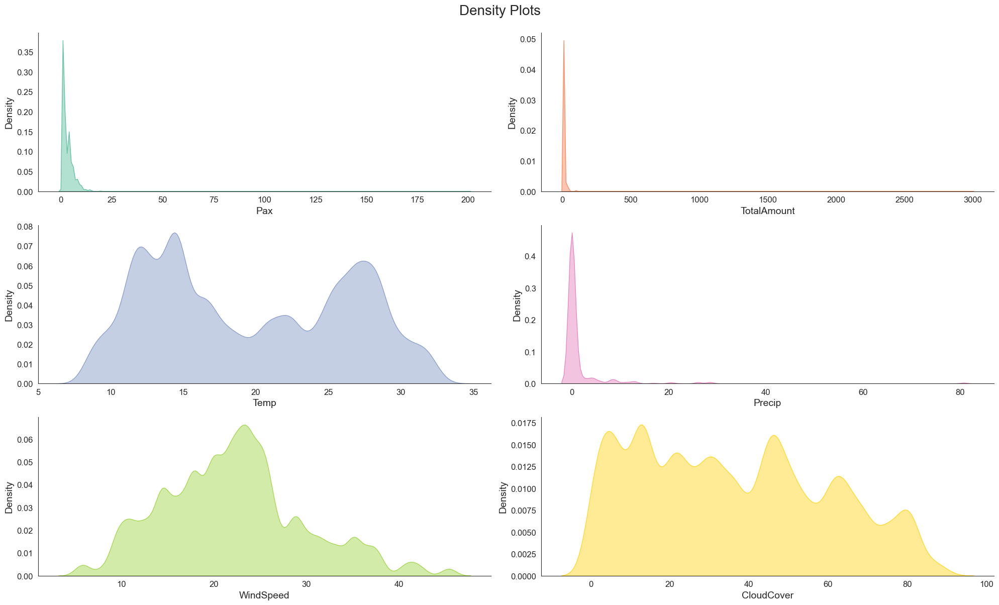

In [302]:
%matplotlib inline
numerical_vars=['Pax','TotalAmount','Temp','Precip','WindSpeed','CloudCover']
fig, axes = plt.subplots(3, ceil(len(numerical_vars) / 3), figsize=(20, 12))
palette = sns.color_palette('Set2', n_colors=len(numerical_vars))

for i, (col, color) in enumerate(zip(numerical_vars, palette)):
    sns.kdeplot(data=ds_imp, x=col, fill=True, ax=axes.flatten()[i], alpha=0.5, color=color)
    axes.flatten()[i].set_xlabel(col, fontsize=14)
    axes.flatten()[i].set_ylabel('Density', fontsize=14)
    axes.flatten()[i].tick_params(axis='both', which='major', labelsize=12)

title = "Density Plots"
plt.suptitle(title, y= 1.0, fontsize=20)

sns.despine()
plt.tight_layout()
plt.show()

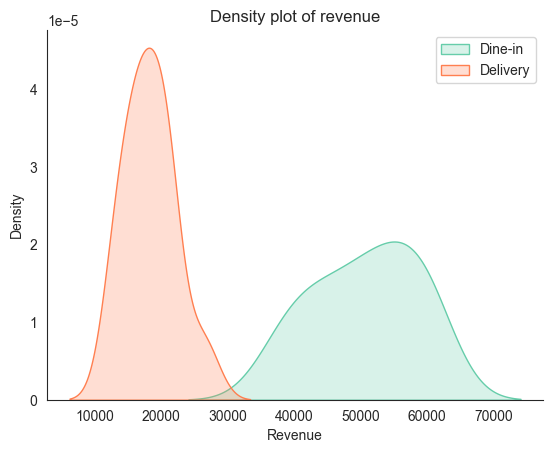

In [303]:
# Group the data by month and calculate the total revenue for each dataframe
monthly_revenue_isdelivery = ds_imp[ds_imp['IsDelivery']==1].groupby(
        ds_imp['InvoiceDateHour'].dt.strftime('%m'))['TotalAmount'].agg('sum')
monthly_revenue_isnotdelivery = ds_imp[ds_imp['IsDelivery']==0].groupby(
        ds_imp['InvoiceDateHour'].dt.strftime('%m'))['TotalAmount'].agg('sum')

# Combine the revenues for both dataframes into a single dataframe
monthly_revenue = pd.DataFrame({'IsDelivery': monthly_revenue_isdelivery, 'IsNotDelivery': monthly_revenue_isnotdelivery})

# Create a new 'index' column
monthly_revenue['index'] = monthly_revenue.index

# Convert the data to a long format
monthly_revenue_long = pd.melt(monthly_revenue, id_vars=['index'], value_vars=['IsDelivery', 'IsNotDelivery'])

# Create a KDE plot with fill color
sns.kdeplot(data=monthly_revenue_long, x='value', hue='variable', fill=True, palette={"IsDelivery": "coral", "IsNotDelivery": 
                                                                                      "mediumaquamarine"})

# Set the x-axis label
plt.xlabel('Revenue')

# Set the y-axis label
plt.ylabel('Density')

# Add a legend to the plot
plt.legend(['Dine-in','Delivery'])

# Add a title to the plot
plt.title('Density plot of revenue')

plt.grid(False) # to remove the grid

# Show the plot
sns.despine()
plt.show()

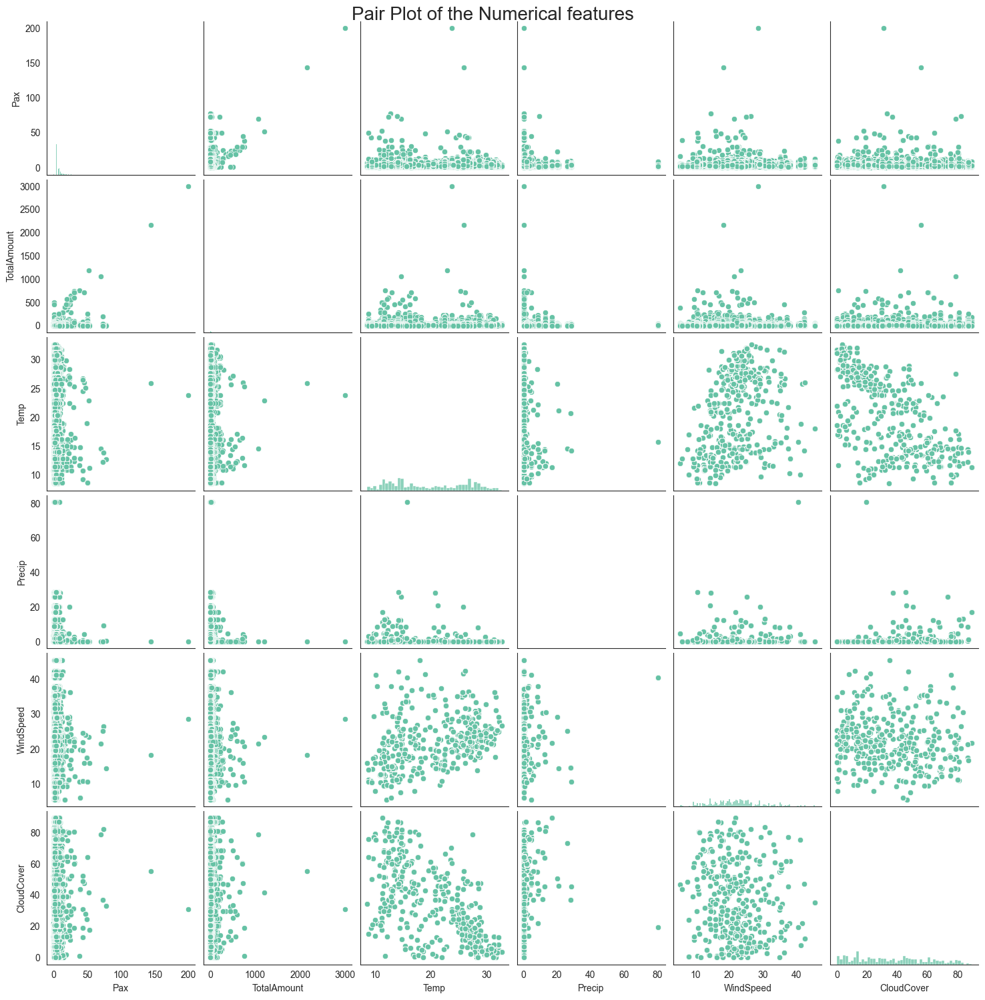

In [304]:
sns.set_style("white")

sns.pairplot(ds_imp[numerical_vars], palette = sns.set_palette('Set2'))

title = "Pair Plot of the Numerical features"
plt.suptitle(title, y=1, fontsize=20)

plt.show()

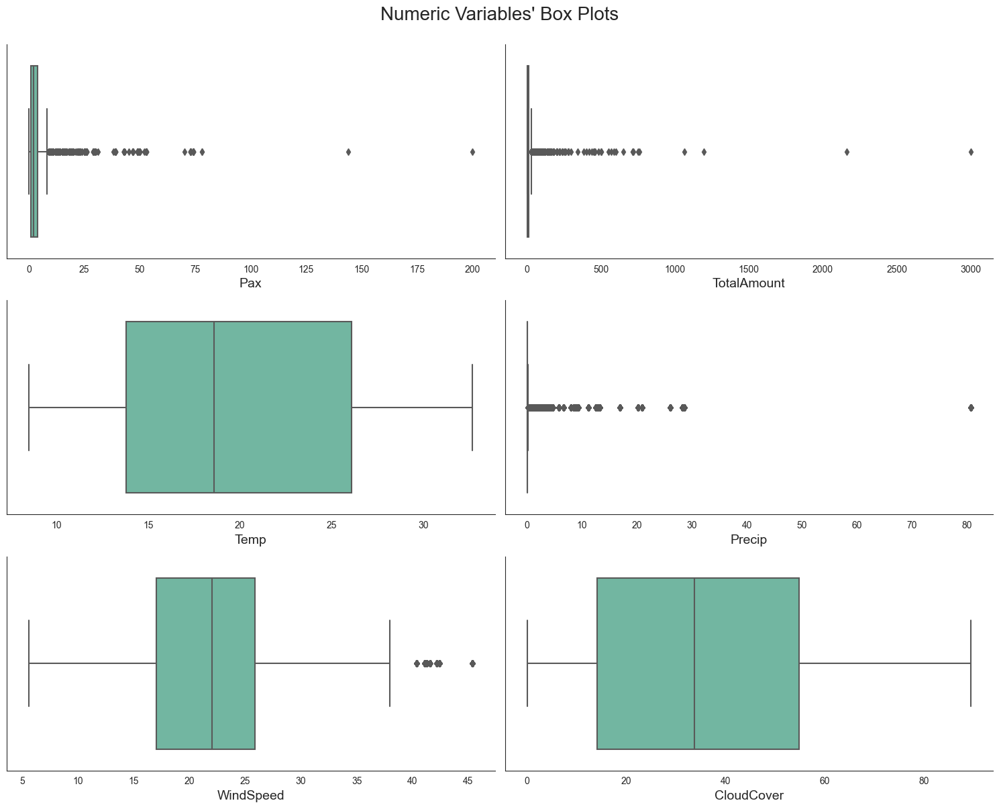

In [305]:
# Prepare figure. Create individual axes where each box plot will be placed
fig, axes = plt.subplots(3, 2, figsize=(15,12))

# Iterate across axes objects and associate each box plot
for ax, feat in zip(axes.flatten(), numerical_vars): 
    sns.boxplot(x=ds_imp[feat], ax=ax, palette='Set2')
    ax.set_xlabel(feat, fontsize=14)
    
title = "Numeric Variables' Box Plots"
plt.suptitle(title, y = 1.0, fontsize=20)

sns.despine()
plt.tight_layout()
plt.show()

We analyzed these visualizations along with the ones on the pandas profiling report to extract the needed insights. 

<hr>
<a class="anchor" id="datapreparation">
    
# 3. Data Preparation
    
    
</a>

<a class="anchor" id="inconsistencies">
    
## 3.1. Inconsistencies/Incoherences
    
    
</a>

In [306]:
# Since the records where the product designation is 'FOOD' or 'DRINK' correspond to groups or special menus, we decided to
#remove them because, since we don't know which products were ordered, they wouldn't be useful for the association rules.
# However, we will analyse them separately since they could offer interesting insights.
group_menus = ds_imp[(ds_imp['ProductDesignation']=='DRINK') | (ds_imp['ProductDesignation']=='FOOD')]
ds_imp = ds_imp[(ds_imp['ProductDesignation']!='DRINK') & (ds_imp['ProductDesignation']!='FOOD')]

In [307]:
# We have customers that have transactions in 2018 but are only customers since 2019
ds_imp[ds_imp['CustomerSince']>'2019']

,DocNumber,ProductDesignation,ProductFamily,Qty,TotalAmount,InvoiceDateHour,EmployeeID,IsDelivery,Pax,CustomerID,CustomerCity,CustomerSince,IsHoliday,Season,Temp,Precip,WindSpeed,CloudCover
183,TKD0320000242018,1/4 DUCK,STARTERS,1.0,15.80,2018-01-02 19:09:54,2,1,1,14646,LAKATAMEIA,2019-06-27 20:30:02.223,0,Winter,12.4,0.000,22.1,27.5
184,TKD0320000242018,SPRING ROLL,STARTERS,2.0,4.40,2018-01-02 19:09:54,2,1,1,14646,LAKATAMEIA,2019-06-27 20:30:02.223,0,Winter,12.4,0.000,22.1,27.5
185,TKD0320000242018,SWEET SOUR CHICKEN,MEAT,1.0,10.10,2018-01-02 19:09:54,2,1,1,14646,LAKATAMEIA,2019-06-27 20:30:02.223,0,Winter,12.4,0.000,22.1,27.5
186,TKD0320000242018,NOODLES BEAN SPROUTS,RICE,1.0,6.70,2018-01-02 19:09:54,2,1,1,14646,LAKATAMEIA,2019-06-27 20:30:02.223,0,Winter,12.4,0.000,22.1,27.5
187,TKD0320000242018,DELIVERY CHARGE,EXTRAS,1.0,1.00,2018-01-02 19:09:54,2,1,1,14646,LAKATAMEIA,2019-06-27 20:30:02.223,0,Winter,12.4,0.000,22.1,27.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
83845,TKD0320044322018,STEAMED RICE,RICE,2.0,8.80,2018-12-31 19:46:49,2,1,1,6048,EGKOMI,2019-02-22 19:38:50.667,0,Winter,9.3,1.899,10.4,50.4
83846,TKD0320044322018,SPICY NOODLES,RICE,1.0,7.60,2018-12-31 19:46:49,2,1,1,6048,EGKOMI,2019-02-22 19:38:50.667,0,Winter,9.3,1.899,10.4,50.4
83847,TKD0320044322018,CALIFORNIA MAKI,JAP SUSHI,1.0,7.20,2018-12-31 19:46:49,2,1,1,6048,EGKOMI,2019-02-22 19:38:50.667,0,Winter,9.3,1.899,10.4,50.4
83848,TKD0320044322018,TSANTA,TSANTES,1.0,0.06,2018-12-31 19:46:49,2,1,1,6048,EGKOMI,2019-02-22 19:38:50.667,0,Winter,9.3,1.899,10.4,50.4


In [308]:
# There are customers that have a date of creation higher than the date of an invoice (which include the ones above).
# Therefore we will turn them into missing values.
ds_imp.loc[ds_imp['InvoiceDateHour'] < ds_imp['CustomerSince']]

,DocNumber,ProductDesignation,ProductFamily,Qty,TotalAmount,InvoiceDateHour,EmployeeID,IsDelivery,Pax,CustomerID,CustomerCity,CustomerSince,IsHoliday,Season,Temp,Precip,WindSpeed,CloudCover
183,TKD0320000242018,1/4 DUCK,STARTERS,1.0,15.80,2018-01-02 19:09:54,2,1,1,14646,LAKATAMEIA,2019-06-27 20:30:02.223,0,Winter,12.4,0.000,22.1,27.5
184,TKD0320000242018,SPRING ROLL,STARTERS,2.0,4.40,2018-01-02 19:09:54,2,1,1,14646,LAKATAMEIA,2019-06-27 20:30:02.223,0,Winter,12.4,0.000,22.1,27.5
185,TKD0320000242018,SWEET SOUR CHICKEN,MEAT,1.0,10.10,2018-01-02 19:09:54,2,1,1,14646,LAKATAMEIA,2019-06-27 20:30:02.223,0,Winter,12.4,0.000,22.1,27.5
186,TKD0320000242018,NOODLES BEAN SPROUTS,RICE,1.0,6.70,2018-01-02 19:09:54,2,1,1,14646,LAKATAMEIA,2019-06-27 20:30:02.223,0,Winter,12.4,0.000,22.1,27.5
187,TKD0320000242018,DELIVERY CHARGE,EXTRAS,1.0,1.00,2018-01-02 19:09:54,2,1,1,14646,LAKATAMEIA,2019-06-27 20:30:02.223,0,Winter,12.4,0.000,22.1,27.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
83845,TKD0320044322018,STEAMED RICE,RICE,2.0,8.80,2018-12-31 19:46:49,2,1,1,6048,EGKOMI,2019-02-22 19:38:50.667,0,Winter,9.3,1.899,10.4,50.4
83846,TKD0320044322018,SPICY NOODLES,RICE,1.0,7.60,2018-12-31 19:46:49,2,1,1,6048,EGKOMI,2019-02-22 19:38:50.667,0,Winter,9.3,1.899,10.4,50.4
83847,TKD0320044322018,CALIFORNIA MAKI,JAP SUSHI,1.0,7.20,2018-12-31 19:46:49,2,1,1,6048,EGKOMI,2019-02-22 19:38:50.667,0,Winter,9.3,1.899,10.4,50.4
83848,TKD0320044322018,TSANTA,TSANTES,1.0,0.06,2018-12-31 19:46:49,2,1,1,6048,EGKOMI,2019-02-22 19:38:50.667,0,Winter,9.3,1.899,10.4,50.4


In [309]:
# Turning the values in 'CustomerSince' where the 'InvoiceDateHour' is lower than 'CustomerSince' into NaNs
ds_imp.loc[ds_imp['InvoiceDateHour']<ds_imp['CustomerSince'],'CustomerSince']=np.nan

In [310]:
# As we have seen above, this 'CustomerID' seems to be used generically thus we will turn it into missing values
ds_imp.loc[ds_imp['CustomerID']==0, 'CustomerID'] = np.nan

In [311]:
# None of the complimentaries are paid
np.unique(ds_imp[(ds_imp['ProductDesignation']=='COFFEE COMPLIMENTARY') | (ds_imp['ProductDesignation']==
'LYCHEES COMPLIMENTARY') | (ds_imp['ProductDesignation']=='TOFFEE APPLE COMPLEMENTARY') | (ds_imp['ProductDesignation']==
'TOFFEE BANANA COMPLEMENTARY')]['TotalAmount'])

array([0.])

In [312]:
# Removing offers from the dataset.
# We can analyze it separately but we will not use it in the association rules as we assume that these products were not asked
#for in specific, but rather given by the restaurant.
offers = ds_imp[(ds_imp['TotalAmount']==0) & ((ds_imp['ProductDesignation']=='CHIVAS') |
        (ds_imp['ProductDesignation']=='CRISPY AROMATIC DUCK')  | (ds_imp['ProductDesignation']=='FAMOUS') |
        (ds_imp['ProductDesignation']=='J.WALKER BLACK') | (ds_imp['ProductDesignation']=='J.WALKER RED') |
        (ds_imp['ProductDesignation']=='MONTLY WINES') | (ds_imp['ProductDesignation']=='PRAWN CRACKERS') |
        (ds_imp['ProductDesignation']=='COFFEE COMPLIMENTARY') | (ds_imp['ProductDesignation']=='TOFFEE APPLE COMPLEMENTARY') |
        (ds_imp['ProductDesignation']=='LYCHEES COMPLIMENTARY') | (ds_imp['ProductDesignation']=='J&B') |
        (ds_imp['ProductDesignation']=='TOFFEE BANANA COMPLEMENTARY'))].copy()

ds_imp.drop(offers.index, inplace=True)

In [313]:
# As we have seen above, for all 'IsDelivery' equal to 1, 'Pax' is registered as 1 but we actually do not know for how many
#people the food is, so we're transforming the values into NaNs
ds_imp.loc[ds_imp['IsDelivery']==1,'Pax']=np.nan

In [314]:
# Having 'Pax' equal to 0 also does not give us any information so for the sake of clarity we will also transform the values
#into missing values
ds_imp.loc[ds_imp['Pax']==0, 'Pax'] = np.nan

In [315]:
# Since we have different records corresponding to the same DocNumber and the same product, we decided to merge
#these records by doing the sum of 'Qty' and 'TotalAmount' and keeping the other variables constant
duplicates = ds_imp[ds_imp.duplicated(subset=['DocNumber','ProductDesignation'], keep=False)].reset_index()
ds_imp.drop_duplicates(subset=['DocNumber','ProductDesignation'], keep=False, inplace=True)

# The function was created because .mode() can return empty if nothing occurs at least 2 times
def get_mode_or_random(column):
    mode = column.mode()
    if len(mode) == 0:
        return column.sample().iloc[0] # Return a random value from the column
    else:
        return mode[0] # Return the mode value

transform_duplicates={
    'index': lambda x: x.min(),
    'ProductFamily': lambda x: get_mode_or_random(x),
    'Qty': lambda x: x.sum(),
    'TotalAmount': lambda x: x.sum(), 
    'InvoiceDateHour': lambda x: get_mode_or_random(x),
    'IsDelivery': lambda x: get_mode_or_random(x),
    'Pax': lambda x: get_mode_or_random(x),
    'CustomerID': lambda x: get_mode_or_random(x),
    'CustomerCity': lambda x: get_mode_or_random(x),
    'CustomerSince': lambda x: get_mode_or_random(x),
    'IsHoliday': lambda x: get_mode_or_random(x),
    'Season': lambda x: get_mode_or_random(x),
    'Temp': lambda x: get_mode_or_random(x),
    'Precip': lambda x: get_mode_or_random(x),
    'WindSpeed': lambda x: get_mode_or_random(x),
    'CloudCover': lambda x: get_mode_or_random(x)}

transformed_duplicates = duplicates.groupby(['DocNumber','ProductDesignation']).agg(transform_duplicates)
transformed_duplicates = transformed_duplicates.reset_index().set_index('index')
ds_imp = pd.concat([ds_imp, transformed_duplicates])

The problems in the variables ProductDesignation and ProductFamily will be treated in Feature Creation

As a final check for inconsistencies/incoherences and possible outliers that should be removed, we generated a pandas profile.

In [316]:
# Generating a profile report to better explore the data
ProfileReport(  
    ds_imp,    
    title='Restaurant Data',
    correlations={
        "pearson": {"calculate": True},
        "spearman": {"calculate": True},
        "kendall": {"calculate": True},
        "phi_k": {"calculate": True},
        "cramers": {"calculate": True},
    },                 
)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [317]:
# From the pandas profile, we saw this quantity that was much larger than the second highest one (26).
# Still, it seems reasonable considering it is a starter and we had 50 people on the table for that order.
ds_imp[ds_imp['Qty']==53]

,DocNumber,ProductDesignation,ProductFamily,Qty,TotalAmount,InvoiceDateHour,EmployeeID,IsDelivery,Pax,CustomerID,CustomerCity,CustomerSince,IsHoliday,Season,Temp,Precip,WindSpeed,CloudCover
83156,TK0110054302018,SPRING ROLL,STARTERS,53.0,153.7,2018-12-29 15:43:43,2.0,0,50.0,NaN,NaN,NaT,0,Winter,8.7,0.0,10.7,64.5


<a class="anchor" id="dataimputation">
    
## 3.2. Data Imputation
    
    
</a>

In [318]:
ds_imp.isna().sum()

DocNumber                 0
ProductDesignation        0
ProductFamily             0
Qty                       0
TotalAmount               0
InvoiceDateHour           0
EmployeeID             3856
IsDelivery                0
Pax                   29627
CustomerID            46057
CustomerCity          46057
CustomerSince         48904
IsHoliday                 0
Season                    0
Temp                      0
Precip                    0
WindSpeed                 0
CloudCover                0
dtype: int64

In this case, we have decided to not impute the missing values considering that these variables will be used for the visualization and not for the association rules and that these correspond to a high percentage of the available data.

<a class="anchor" id="creation">
    
## 3.3. Feature Creation
    
    
</a>

In [319]:
# Reseting the index of the dataset
ds_imp.reset_index(inplace=True,drop=True)

In [320]:
# Considering the problems mentioned above and the fact that the granularity is important for the market basket analysis,
#we created 4 variables: one combining the quantity ordered and the product, one with only the product and two others with well 
#defined categories for the products

ds_imp['ProductWithQuantity']=ds_imp['ProductDesignation'].copy()
ds_imp['Product']=ds_imp['ProductDesignation'].copy()
ds_imp['ProductCategoryI']=ds_imp['ProductFamily'].copy()
ds_imp['ProductCategoryII']=ds_imp['ProductFamily'].copy()

In [321]:
ds_imp['ProductDesignation'].head()

0              1/2 DUCK
1           SPRING ROLL
2    SWEET SOUR CHICKEN
3         LEMON CHICKEN
4          STEAMED RICE
Name: ProductDesignation, dtype: object

In [322]:
# The problem found above of having j.walker red in drinks does not need to be solved here because it was removed in the 
#inconsistencies part
ds_imp[ds_imp['ProductFamily']=='DRINKS']['ProductDesignation'].unique()

array(['7UP', 'DIET SPRITE', 'MINERAL WATER 1.5LT', 'SPRITE', 'DIET COKE',
       'COKE ZERO', 'SODA', 'COKE', 'ORANGE JUICE', 'FRUIT JUICE 30CL',
       'PERRIER', 'JASMINE TEA', 'DIET 7UP', 'APPLE JUICE', 'FANTA',
       'CYPRUS COFFEE', 'ENGLISH TEA', 'ESPRESSO', 'NESCAFE', 'TONIC',
       'WINE', 'FILTER COFFEE'], dtype=object)

In [323]:
# Here, for the purpose of the variables being created, the family will be switched to Red Wines
ds_imp.loc[ds_imp['ProductDesignation']=='WINE', 'ProductFamily'] = 'RED WINES'

In [324]:
# For the values 'DESSERT', 'DRINK', 'FOOD' and 'WINE', we transformed into missing values and, after, we joined both the 
#quantity and product designation for each value
mask = ds_imp['ProductDesignation'].isin(['DESSERT', 'DRINK', 'FOOD', 'WINE'])
ds_imp['ProductWithQuantity'] = np.where(mask, np.nan, ds_imp['Qty'].astype(str) + ' ' + ds_imp['ProductDesignation'])

In [325]:
ds_imp['ProductWithQuantity']

0                      1.0 1/2 DUCK
1                   8.0 SPRING ROLL
2            2.0 SWEET SOUR CHICKEN
3                 1.0 LEMON CHICKEN
4                  2.0 STEAMED RICE
                    ...            
75637               2.0 SPRING ROLL
75638    2.0 CHICKEN WITH MUSHROOMS
75639         2.0 SHRIMP FRIED RICE
75640                      2.0 NAAN
75641                    2.0 TSANTA
Name: ProductWithQuantity, Length: 75642, dtype: object

In [326]:
# We did again the transformation into missing values but we also transformed certain products ('DUCK', 'TANDOORI CHICK', 
#'WHISKY' and 'ZIVONIA') so as to only contain their name. For example '1/2 DUCK' becomes only 'DUCK'
mask1 = ds_imp['ProductDesignation'].isin(['DESSERT', 'DRINK', 'FOOD', 'WINE'])
mask2 = ds_imp['ProductDesignation'].str.contains('DUCK')
mask3 = ds_imp['ProductDesignation'].str.contains('TANDOORI CHICK')
mask4 = ds_imp['ProductDesignation'].str.contains('WHISKY')
mask5 = ds_imp['ProductDesignation'].str.contains('ZIVONIA')

ds_imp.loc[mask1, 'Product'] = np.nan
ds_imp.loc[mask2, 'Product'] = 'DUCK'
ds_imp.loc[mask3, 'Product'] = 'TANDOORI CHICK'
ds_imp.loc[mask4, 'Product'] = 'WHISKY'
ds_imp.loc[mask5, 'Product'] = 'ZIVONIA'

In [327]:
ds_imp['Product']

0                          DUCK
1                   SPRING ROLL
2            SWEET SOUR CHICKEN
3                 LEMON CHICKEN
4                  STEAMED RICE
                  ...          
75637               SPRING ROLL
75638    CHICKEN WITH MUSHROOMS
75639         SHRIMP FRIED RICE
75640                      NAAN
75641                    TSANTA
Name: Product, Length: 75642, dtype: object

In [328]:
ds_imp['ProductFamily'].unique()

array(['STARTERS', 'MEAT', 'RICE', 'HOLDS', 'DRINKS', 'EXTRAS',
       'SIZZLING', 'JAP SUSHI', 'BREADS IND', 'RICE IND', 'VEG IND',
       'SOUPS', 'START IND', 'MAIN IND', 'WHITE WINE', 'DESSERT IND',
       'NEW SUSHI', 'SEAFOOD', 'SPIRITS', 'DESSERT', 'RED WINES', 'SUSHI',
       'WITH', 'VEG', 'ROSE WINES', 'SIDE IND', 'TSANTES'], dtype=object)

In [329]:
# Here, we grouped the categories to solve the problem with their definition (as discussed above) and always considering the 
#insights that they could generate
merge_categ={
    'STARTERS':'STARTERS',
    'MEAT':'MAIN',
    'SIZZLING':'MAIN',
    'RICE':'SIDES',
    'HOLDS':'OTHERS',
    'DRINKS':'DRINKS',
    'EXTRAS':'OTHERS',
    'JAP SUSHI':'MAIN',
    'BREADS IND':'SIDES',
    'RICE IND':'SIDES',
    'VEG IND':'MAIN',
    'SOUPS':'STARTERS',
    'START IND':'STARTERS',
    'MAIN IND':'MAIN',
    'WHITE WHINE':'DRINKS',
    'SPIRITS':'DRINKS',
    'DESSERT':'DESSERT',
    'DESSERT IND':'DESSERT',
    'NEW SUSHI':'MAIN',
    'SEAFOOD':'MAIN',
    'RED WINES':'DRINKS',
    'SUSHI':'MAIN',
    'WITH':'OTHERS',
    'VEG':'MAIN',
    'ROSE WINES':'DRINKS',
    'SIDE IND':'SIDES',
    'TSANTES':'OTHERS'
}
ds_imp['ProductCategoryI']=ds_imp['ProductCategoryI'].map(merge_categ)

In [330]:
ds_imp['ProductCategoryI']

0        STARTERS
1        STARTERS
2            MAIN
3            MAIN
4           SIDES
           ...   
75637    STARTERS
75638        MAIN
75639       SIDES
75640       SIDES
75641      OTHERS
Name: ProductCategoryI, Length: 75642, dtype: object

In [331]:
# Here, we again grouped the categories to solve the problem with their definition (as discussed above) and always considering 
#the insights that they could generate. In this case, we maintained more categories.
merge_categ={
    'STARTERS':'STARTERS',
    'MEAT':'MAIN',
    'SIZZLING':'MAIN',
    'RICE':'SIDES',
    'HOLDS':'OTHERS',
    'DRINKS':'NON-ALCOHOLIC DRINKS',
    'EXTRAS':'OTHERS',
    'JAP SUSHI':'MAIN',
    'BREADS IND':'SIDES IND',
    'RICE IND':'SIDES IND',
    'VEG IND':'MAIN VEG IND',
    'SOUPS':'STARTERS',
    'START IND':'STARTERS IND',
    'MAIN IND':'MAIN IND',
    'WHITE WHINE':'ALCOHOLIC DRINKS',
    'SPIRITS':'ALCOHOLIC DRINKS',
    'DESSERT':'DESSERT',
    'DESSERT IND':'DESSERT IND',
    'NEW SUSHI':'MAIN',
    'SEAFOOD':'MAIN',
    'RED WINES':'ALCOHOLIC DRINKS',
    'SUSHI':'MAIN',
    'WITH':'OTHERS',
    'VEG':'MAIN VEG',
    'ROSE WINES':'ALCOHOLIC DRINKS',
    'SIDE IND':'SIDES IND',
    'TSANTES':'OTHERS'
}
ds_imp['ProductCategoryII']=ds_imp['ProductCategoryII'].map(merge_categ)

In [332]:
ds_imp['ProductCategoryII']

0         STARTERS
1         STARTERS
2             MAIN
3             MAIN
4            SIDES
           ...    
75637     STARTERS
75638         MAIN
75639        SIDES
75640    SIDES IND
75641       OTHERS
Name: ProductCategoryII, Length: 75642, dtype: object

In [333]:
# To better interpret the results, we transformed this variable into containing only the months compared to the current date
np.set_printoptions(threshold=np.inf)
ds_imp['CustomerSince'].unique()

array([                          'NaT', '2016-03-10T20:52:43.220000000',
       '2018-01-01T19:56:39.830000000', '2018-01-01T20:02:27.267000000',
       '2017-12-02T20:06:33.597000000', '2017-08-17T20:11:59.287000000',
       '2017-03-26T20:19:35.547000000', '2018-01-01T20:21:27.417000000',
       '2018-01-01T20:23:11.127000000', '2018-01-01T20:28:46.597000000',
       '2017-01-31T19:21:01.053000000', '2017-01-06T19:57:02.380000000',
       '2018-01-01T20:37:20.770000000', '2018-01-01T20:50:22.663000000',
       '2017-11-26T19:35:10.080000000', '2018-01-01T20:58:08.170000000',
       '2018-01-01T21:27:11.870000000', '2018-01-01T21:32:47.187000000',
       '2014-12-19T19:59:46.277000000', '2017-11-24T20:26:33.323000000',
       '2012-12-19T20:01:51.377000000', '2017-10-09T20:15:54.127000000',
       '2016-12-01T20:06:37.980000000', '2018-01-02T19:35:07.183000000',
       '2012-12-16T20:17:06.377000000', '2017-02-18T20:57:23.907000000',
       '2018-01-02T19:50:01.230000000', '2018-01-02

In [334]:
np.set_printoptions()

In [335]:
ds_imp['CustomerSince']=ds_imp['CustomerSince'].astype('str')
ds_imp['CustomerSinceMonths']=ds_imp['CustomerSince'].apply(lambda x: x[:10] if isinstance(x, str) else np.nan)
ds_imp['CustomerSince']=pd.to_datetime(ds_imp['CustomerSince'])
ds_imp['CustomerSinceMonths'] = pd.to_datetime(ds_imp['CustomerSinceMonths'])
now = datetime.now()
ds_imp['CustomerSinceMonths'] = (now - ds_imp['CustomerSinceMonths']).astype('<m8[M]')
ds_imp['CustomerSinceMonths'].unique()

array([ nan,  84.,  62.,  63.,  67.,  72.,  73.,  74.,  64.,  99., 123.,
        65.,  75.,  77., 207.,  66., 109., 119.,  80., 126.,  81., 116.,
        69., 108., 133., 107.,  78., 105.,  68., 140.,  76.,  71.,  70.,
       120., 121., 131., 103.,  86., 193.,  79., 122., 134., 156., 157.,
        89.,  88., 115.,  95.,  96., 175., 145., 124., 125., 100.,  98.,
        83.,  85., 117., 114., 110., 132., 136., 128., 111., 139.,  82.,
        87., 106., 113.,  97.,  61.,  90., 177., 112., 130.,  92., 176.,
       174., 129., 185., 170., 135., 206., 155., 104., 151., 127.,  60.,
        94., 205., 154., 171., 101., 118.,  93., 198.,  59., 173.,  91.,
       102.,  58., 147.,  57., 167.,  56., 191.,  55.,  54., 203., 172.,
        53., 137.,  52., 150., 166., 143.,  51., 168.,  50.])

In [336]:
# We also created variables to contain the year, month and day since they were customers
ds_imp['CustomerSinceYear']=ds_imp['CustomerSince'].dt.year
ds_imp['CustomerSinceMonth']=ds_imp['CustomerSince'].dt.month
ds_imp['CustomerSinceDay']=ds_imp['CustomerSince'].dt.day

In [337]:
# We also created variables to contain the month, day and hour of the invoice
ds_imp['InvoiceMonth'] = ds_imp['InvoiceDateHour'].dt.strftime('%B')
ds_imp['InvoiceDay'] = ds_imp['InvoiceDateHour'].dt.day
ds_imp['InvoiceHour']= ds_imp['InvoiceDateHour'].dt.hour

In [338]:
# Finally, we created a new variable corresponding to the day of the week in which the order was made
ds_imp['DayWeek']=ds_imp['InvoiceDateHour'].dt.day_name()

In [339]:
ds_imp.head()

,DocNumber,ProductDesignation,ProductFamily,Qty,TotalAmount,InvoiceDateHour,EmployeeID,IsDelivery,Pax,CustomerID,...,ProductCategoryI,ProductCategoryII,CustomerSinceMonths,CustomerSinceYear,CustomerSinceMonth,CustomerSinceDay,InvoiceMonth,InvoiceDay,InvoiceHour,DayWeek
0,TKD0320000012018,1/2 DUCK,STARTERS,1.0,27.1,2018-01-01 19:12:12,2.0,1,NaN,53908.0,...,STARTERS,STARTERS,NaN,NaN,NaN,NaN,January,1,19,Monday
1,TKD0320000012018,SPRING ROLL,STARTERS,8.0,17.6,2018-01-01 19:12:12,2.0,1,NaN,53908.0,...,STARTERS,STARTERS,NaN,NaN,NaN,NaN,January,1,19,Monday
2,TKD0320000012018,SWEET SOUR CHICKEN,MEAT,2.0,20.2,2018-01-01 19:12:12,2.0,1,NaN,53908.0,...,MAIN,MAIN,NaN,NaN,NaN,NaN,January,1,19,Monday
3,TKD0320000012018,LEMON CHICKEN,MEAT,1.0,10.1,2018-01-01 19:12:12,2.0,1,NaN,53908.0,...,MAIN,MAIN,NaN,NaN,NaN,NaN,January,1,19,Monday
4,TKD0320000012018,STEAMED RICE,RICE,2.0,8.8,2018-01-01 19:12:12,2.0,1,NaN,53908.0,...,SIDES,SIDES,NaN,NaN,NaN,NaN,January,1,19,Monday


<a class="anchor" id="kpis">
    
## 3.4. Company's KPIs and Customer/Product Analysis
    
    
</a>

In [340]:
# Calculate the total revenue
total_revenue = ds_imp['TotalAmount'].sum()
round(total_revenue,2)

805240.79

In [341]:
# Calculate the average monthly revenue
round(total_revenue/12,2)

67103.4

In [342]:
# Determine the total customers for which we have a record 
total_customers = ds_imp['CustomerID'].nunique()
total_customers

2313

In [343]:
# Calculate the average yearly revenue per customer
round(total_revenue/total_customers, 2)

348.14

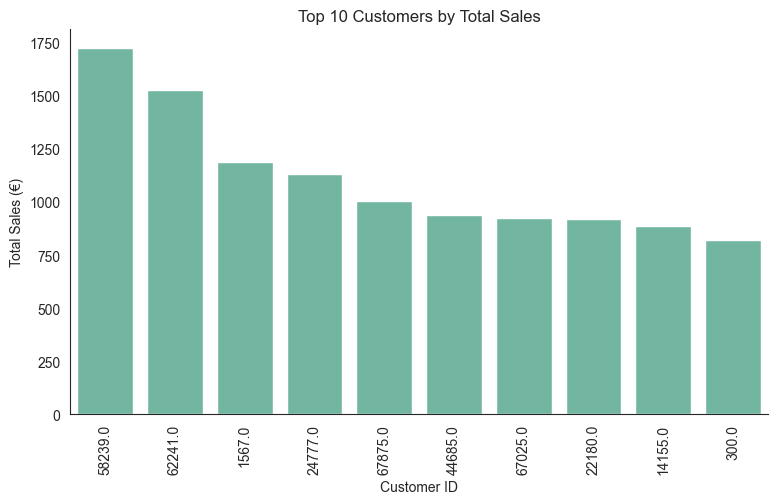

In [344]:
# Calculate total sales by CustomerID
sales_by_customer=ds_imp.groupby('CustomerID')['TotalAmount'].sum()

# Sort by descending sales volume
sales_by_customer = sales_by_customer.sort_values(ascending=False).head(10)
sales_by_customer.index=sales_by_customer.index.astype('str')

# Create bar chart
plt.figure(figsize=(9,5))
colors = sns.color_palette('Set2', n_colors=1)
sns.barplot(x=sales_by_customer.index,y=sales_by_customer.values, palette=colors)
plt.xlabel('Customer ID')
plt.xticks(rotation=90)
plt.ylabel('Total Sales (€)')
plt.title('Top 10 Customers by Total Sales')

sns.despine()
plt.show()

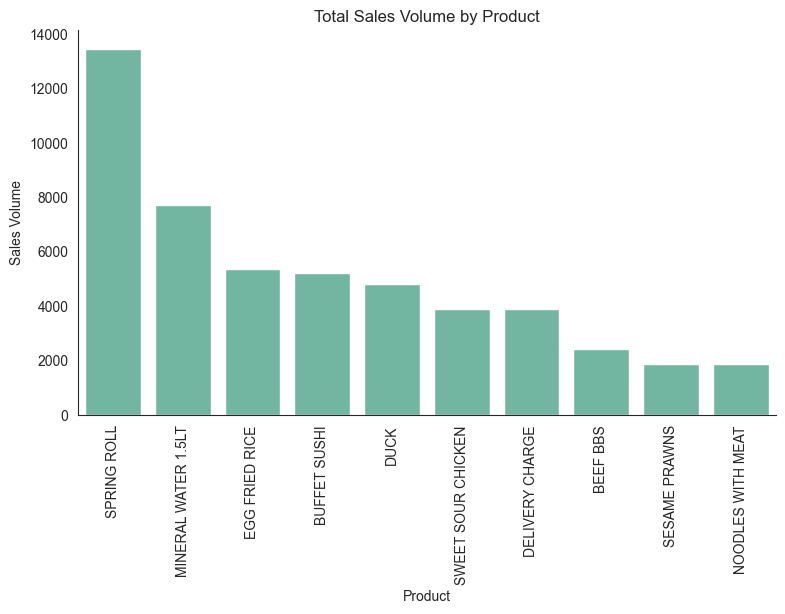

In [345]:
# Calculate total sales volume by ProductCategoryI
sales_by_family = ds_imp.groupby('Product')['Qty'].sum()

# Sort by descending sales volume
sales_by_family = sales_by_family.sort_values(ascending=False).head(10)

# Create bar chart
plt.figure(figsize=(9,5))
colors = sns.color_palette('Set2', n_colors=1)
sns.barplot(x=sales_by_family.index, y=sales_by_family.values, palette=colors)
plt.xlabel('Product')
plt.xticks(rotation=90)
plt.ylabel('Sales Volume')
plt.title('Total Sales Volume by Product')

sns.despine()
plt.show()

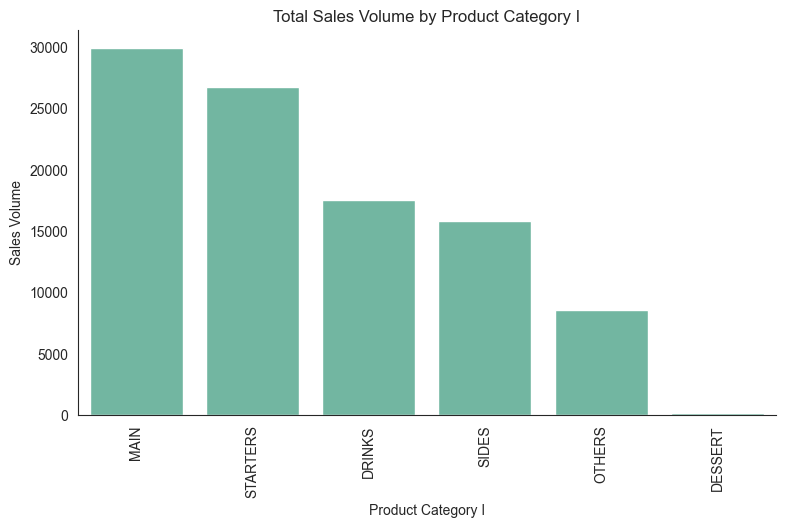

In [346]:
# Calculate total sales volume by ProductCategoryI
sales_by_family = ds_imp.groupby('ProductCategoryI')['Qty'].sum()

# Sort by descending sales volume
sales_by_family = sales_by_family.sort_values(ascending=False)

# Create bar chart
plt.figure(figsize=(9,5))
colors = sns.color_palette('Set2', n_colors=1)
sns.barplot(x=sales_by_family.index, y=sales_by_family.values, palette=colors)
plt.xlabel('Product Category I')
plt.xticks(rotation=90)
plt.ylabel('Sales Volume')
plt.title('Total Sales Volume by Product Category I')

sns.despine()
plt.show()

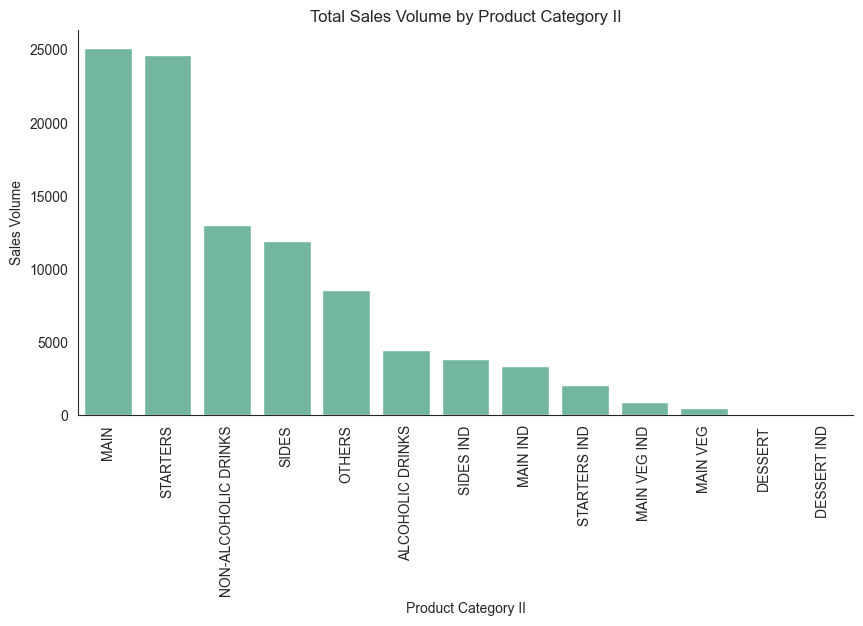

In [347]:
# Calculate total sales volume by ProductCategoryII
sales_by_family = ds_imp.groupby('ProductCategoryII')['Qty'].sum()

# Sort by descending sales volume
sales_by_family = sales_by_family.sort_values(ascending=False)

# Create bar chart
plt.figure(figsize=(10,5))
colors = sns.color_palette('Set2', n_colors=1)
sns.barplot(x=sales_by_family.index, y=sales_by_family.values, palette=colors)
plt.xlabel('Product Category II')
plt.xticks(rotation=90)
plt.ylabel('Sales Volume')
plt.title('Total Sales Volume by Product Category II')

sns.despine()
plt.show()

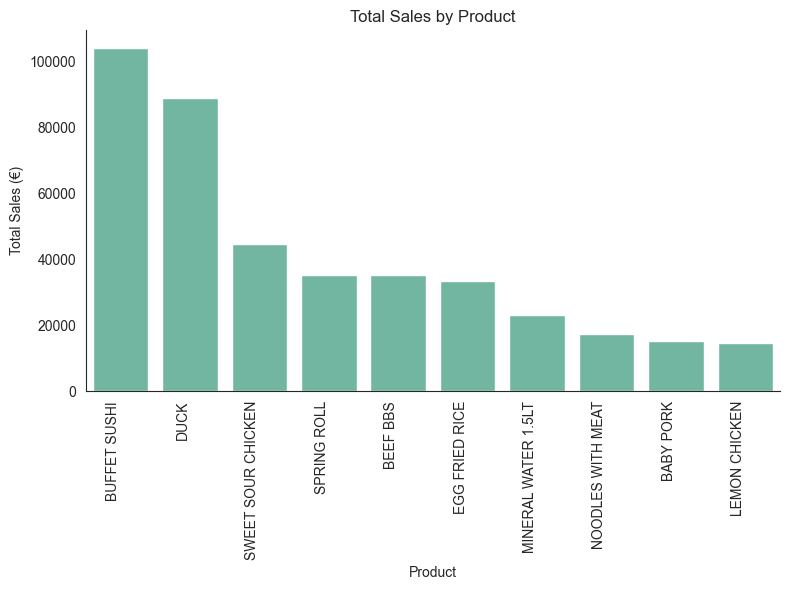

In [348]:
# Calculate total sales volume by Product
sales_by_family = ds_imp.groupby('Product')['TotalAmount'].sum()

# Sort by descending sales volume
sales_by_family = sales_by_family.sort_values(ascending=False).head(10)

# Create bar chart
plt.figure(figsize=(8,6))
colors = sns.color_palette('Set2', n_colors=1)
sns.barplot(x=sales_by_family.index, y=sales_by_family.values, palette=colors)
plt.xlabel('Product')
plt.ylabel('Total Sales (€)')
plt.title('Total Sales by Product')
plt.xticks(rotation=90, ha='right')
plt.tight_layout()

sns.despine()
plt.show()

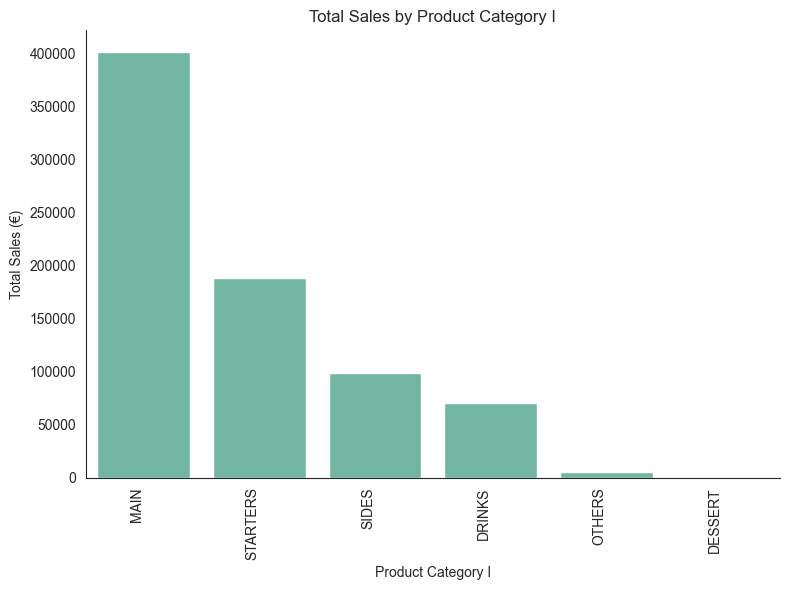

In [349]:
# Calculate total sales volume by ProductCategoryI
sales_by_family = ds_imp.groupby('ProductCategoryI')['TotalAmount'].sum()

# Sort by descending sales volume
sales_by_family = sales_by_family.sort_values(ascending=False)

# Create bar chart
plt.figure(figsize=(8,6))
colors = sns.color_palette('Set2', n_colors=1)
sns.barplot(x=sales_by_family.index, y=sales_by_family.values, palette=colors)
plt.xlabel('Product Category I')
plt.ylabel('Total Sales (€)')
plt.title('Total Sales by Product Category I')
plt.xticks(rotation=90, ha='right')
plt.tight_layout()

sns.despine()
plt.show()

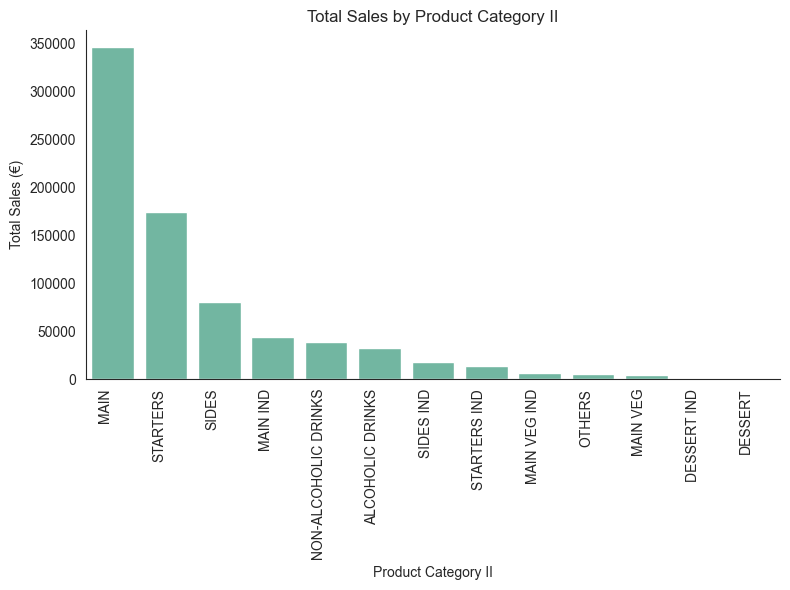

In [350]:
# Calculate total sales volume by ProductCategoryII
sales_by_family = ds_imp.groupby('ProductCategoryII')['TotalAmount'].sum()

# Sort by descending sales volume
sales_by_family = sales_by_family.sort_values(ascending=False)

# Create bar chart
plt.figure(figsize=(8,6))
colors = sns.color_palette('Set2', n_colors=1)
sns.barplot(x=sales_by_family.index, y=sales_by_family.values, palette=colors)
plt.xlabel('Product Category II')
plt.ylabel('Total Sales (€)')
plt.title('Total Sales by Product Category II')
plt.xticks(rotation=90, ha='right')
plt.tight_layout()

sns.despine()
plt.show()

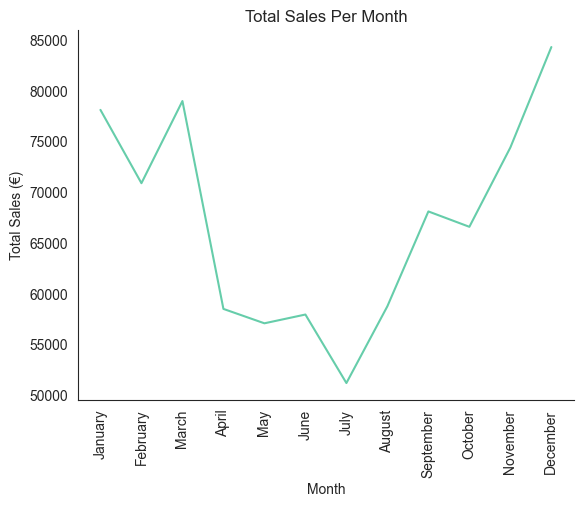

In [351]:
# Define the order of the months
Months = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 
          'December']

# Calculate total amount spent by date
sales_by_date = ds_imp.groupby('InvoiceMonth')['TotalAmount'].sum()

# Create line chart
plt.plot(Months, [sales_by_date[month] for month in Months], color='mediumaquamarine')
plt.xticks(rotation=90)
plt.xlabel('Month')
plt.ylabel('Total Sales (€)')
plt.title('Total Sales Per Month')

sns.despine()
plt.show()

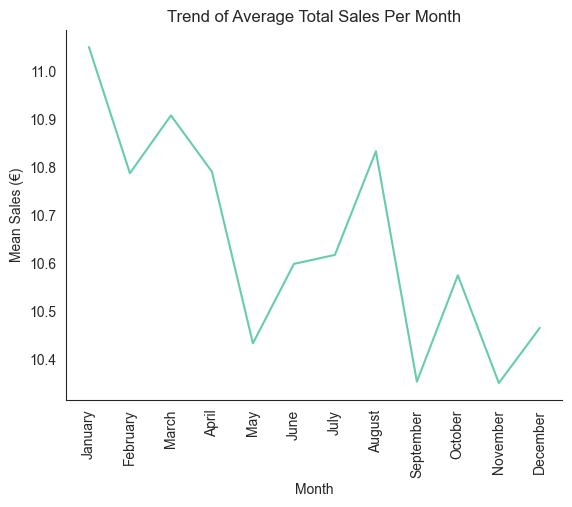

In [352]:
# Define the order of the months
Months = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 
          'December']

# Calculate total amount spent by date
sales_by_date = ds_imp.groupby('InvoiceMonth')['TotalAmount'].mean()

# Create line chart
plt.plot(Months, [sales_by_date[month] for month in Months], color='mediumaquamarine')
plt.xticks(rotation=90)
plt.xlabel('Month')
plt.ylabel('Mean Sales (€)')
plt.title('Trend of Average Total Sales Per Month')

sns.despine()
plt.show()

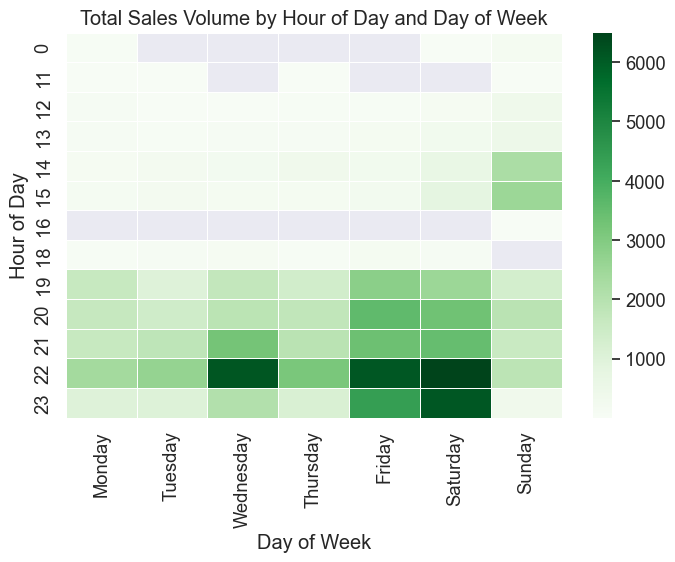

In [353]:
# Create a pivot table of sales by hour and day
sales_by_hour_and_day = pd.pivot_table(ds_imp, values='Qty', index=ds_imp['InvoiceDateHour'].dt.hour, 
                                       columns=ds_imp['InvoiceDateHour'].dt.dayofweek, aggfunc='sum')

# Create heatmap
sns.set(font_scale=1.2)
plt.figure(figsize=(8, 5))
sns.heatmap(sales_by_hour_and_day, cmap='Greens', annot=False, fmt='g', linewidths=.5, xticklabels=['Monday', 'Tuesday', 
                                                                    'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'])
plt.title('Total Sales Volume by Hour of Day and Day of Week')
plt.xlabel('Day of Week')
plt.ylabel('Hour of Day')
plt.show()

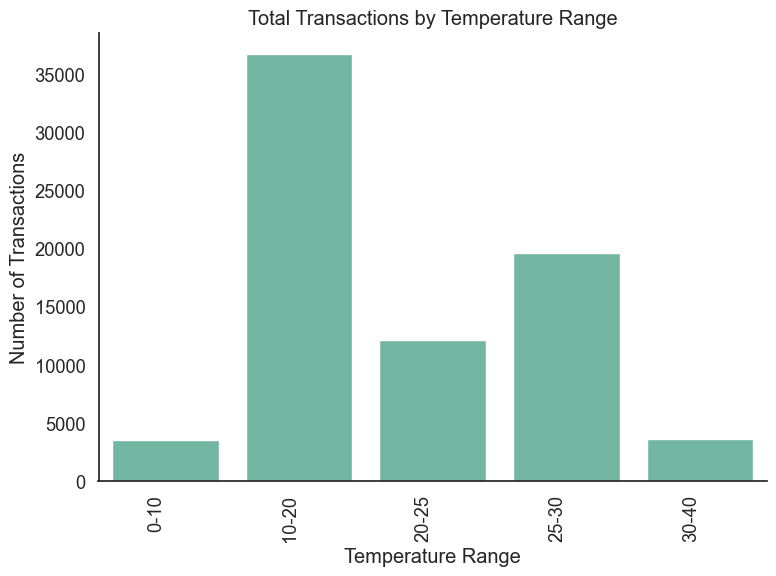

In [354]:
# Bin temperature into 5 categories
ds_imp['TempBin'] = pd.cut(ds_imp['Temp'], bins=[0, 10, 20, 25, 30, 40],labels=['0-10', '10-20', '20-25', '25-30', '30-40'])

# Calculate total amount by temperature bin
amount_temp = ds_imp.groupby('TempBin').size()

# Create bar chart
sns.set_style("white")
plt.figure(figsize=(8,6))
colors = sns.color_palette('Set2', n_colors=1)
sns.barplot(x=amount_temp.index, y=amount_temp.values, palette=colors)
plt.xlabel('Temperature Range')
plt.ylabel('Number of Transactions')
plt.title('Total Transactions by Temperature Range')
plt.xticks(rotation=90, ha='right')
plt.tight_layout()
ax.grid('False')

sns.despine()
plt.show()

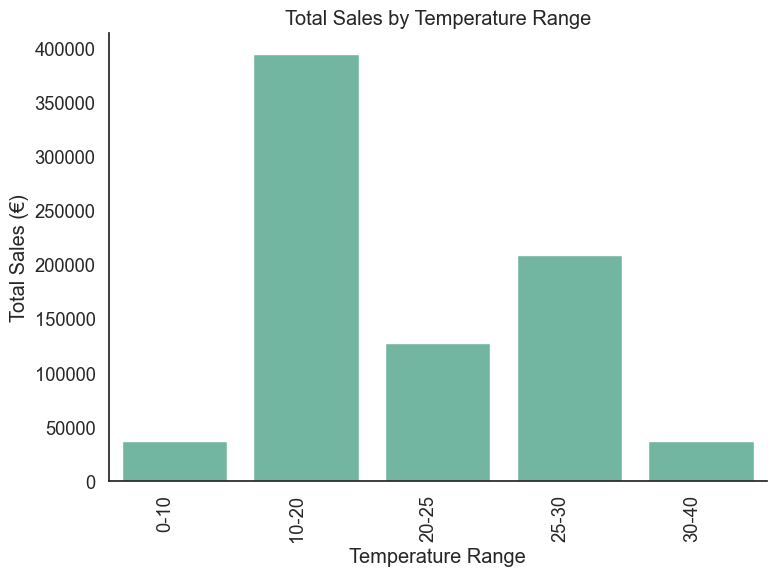

In [355]:
# Calculate total amount by temperature bin
amount_temp = ds_imp.groupby('TempBin')['TotalAmount'].sum()

# Create bar chart
sns.set_style("white")
plt.figure(figsize=(8,6))
colors = sns.color_palette('Set2', n_colors=1)
sns.barplot(x=amount_temp.index, y=amount_temp.values, palette=colors)
plt.xlabel('Temperature Range')
plt.ylabel('Total Sales (€)')
plt.title('Total Sales by Temperature Range')
plt.xticks(rotation=90, ha='right')
plt.tight_layout()

sns.despine()
plt.show()

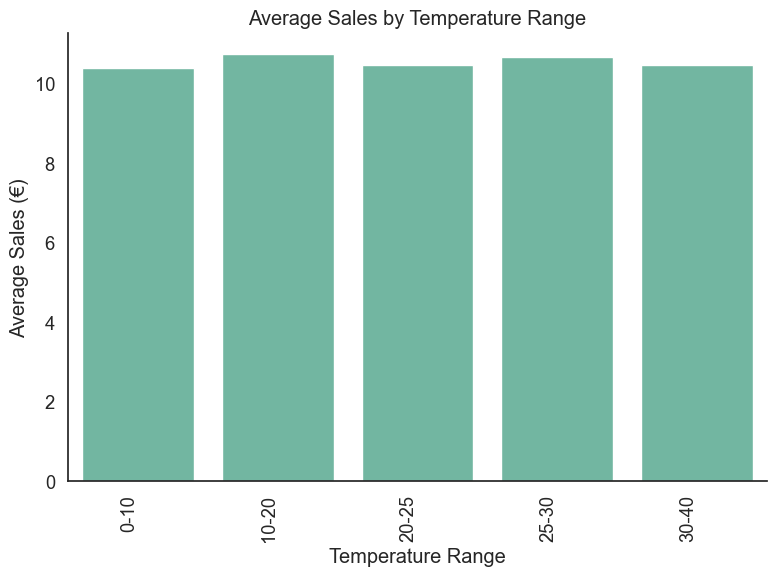

In [356]:
# Calculate total amount by temperature bin
amount_temp = ds_imp.groupby('TempBin')['TotalAmount'].mean()

# Create bar chart
sns.set_style("white")
plt.figure(figsize=(8,6))
colors = sns.color_palette('Set2', n_colors=1)
sns.barplot(x=amount_temp.index, y=amount_temp.values, palette=colors)
plt.xlabel('Temperature Range')
plt.ylabel('Average Sales (€)')
plt.title('Average Sales by Temperature Range')
plt.xticks(rotation=90, ha='right')
plt.tight_layout()

sns.despine()
plt.show()

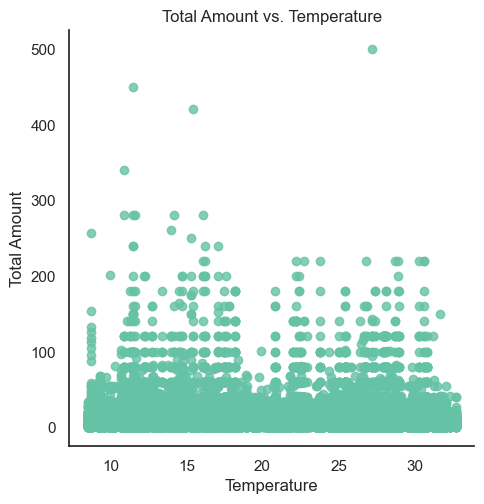

In [357]:
# Create scatterplot with regression line
sns.set_theme(style='white')
sns.lmplot(x='Temp', y='TotalAmount', data=ds_imp, height=5, palette = sns.set_palette('Set2'))

# Set title and axis labels
plt.title('Total Amount vs. Temperature')
plt.xlabel('Temperature')
plt.ylabel('Total Amount')

# Show the plot
sns.despine()
plt.show()

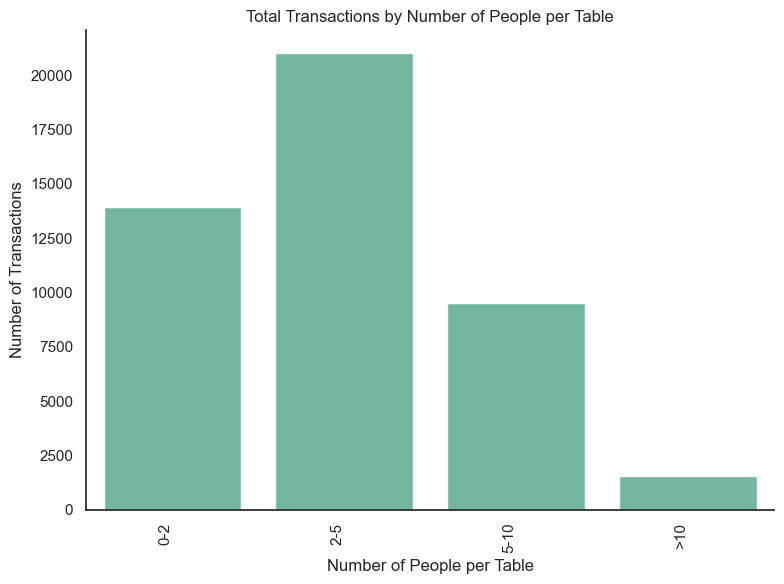

In [358]:
# Bin Pax into 4 groups
ds_imp['PaxBin'] = pd.cut(ds_imp['Pax'], bins=[0, 2, 5, 10, float('inf')],labels=['0-2', '2-5', '5-10', '>10'])

# Calculate total amount by pax bin
amount_pax = ds_imp.groupby('PaxBin').size()

# Create bar chart
plt.figure(figsize=(8,6))
colors = sns.color_palette('Set2', n_colors=1)
sns.barplot(x=amount_pax.index, y=amount_pax.values, palette=colors)
plt.xlabel('Number of People per Table')
plt.ylabel('Number of Transactions')
plt.title('Total Transactions by Number of People per Table')
plt.xticks(rotation=90, ha='right')
plt.tight_layout()

sns.despine()
plt.show()

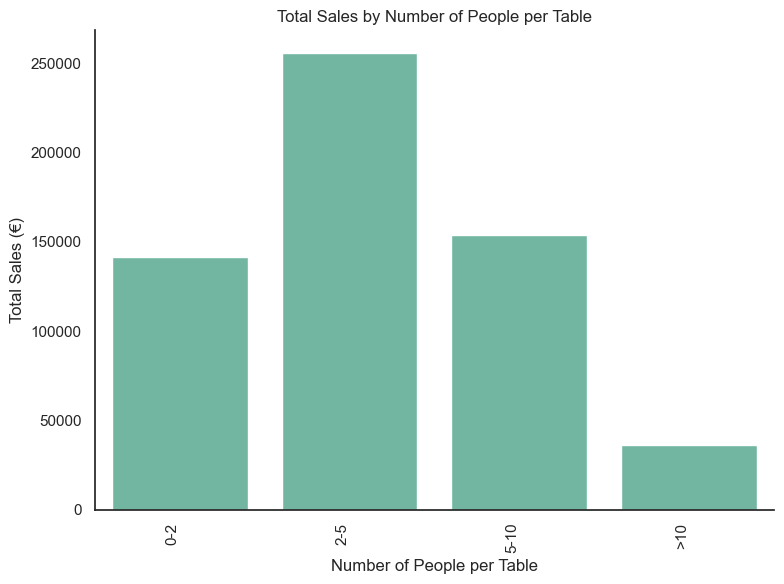

In [359]:
# Calculate total sales by pax bin
amount_temp = ds_imp.groupby('PaxBin')['TotalAmount'].sum()

# Create bar chart
plt.figure(figsize=(8,6))
colors = sns.color_palette('Set2', n_colors=1)
sns.barplot(x=amount_temp.index, y=amount_temp.values, palette=colors)
plt.xlabel('Number of People per Table')
plt.ylabel('Total Sales (€)')
plt.title('Total Sales by Number of People per Table')
plt.xticks(rotation=90, ha='right')
plt.tight_layout()

sns.despine()
plt.show()

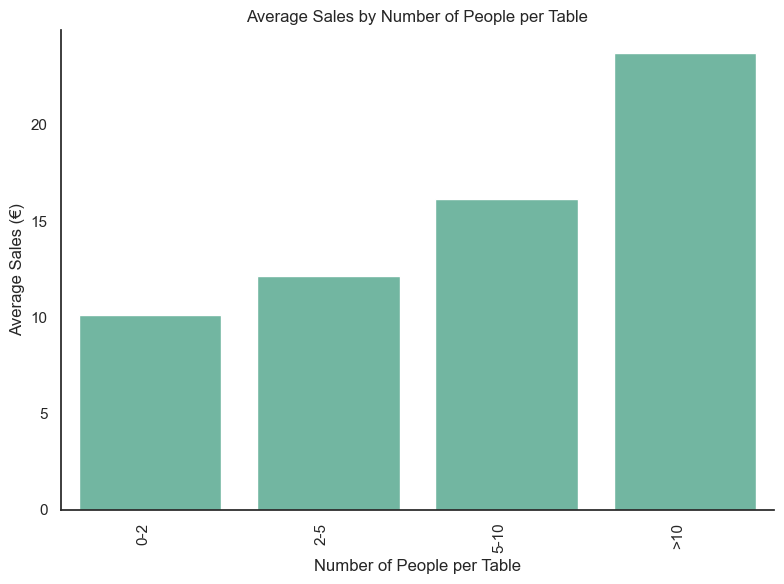

In [360]:
# Calculate mean sales by 'Pax' bin
amount_temp = ds_imp.groupby('PaxBin')['TotalAmount'].mean()

# Create bar chart
plt.figure(figsize=(8,6))
colors = sns.color_palette('Set2', n_colors=1)
sns.barplot(x=amount_temp.index, y=amount_temp.values, palette=colors)
plt.xlabel('Number of People per Table')
plt.ylabel('Average Sales (€)')
plt.title('Average Sales by Number of People per Table')
plt.xticks(rotation=90, ha='right')
plt.tight_layout()

sns.despine()
plt.show()

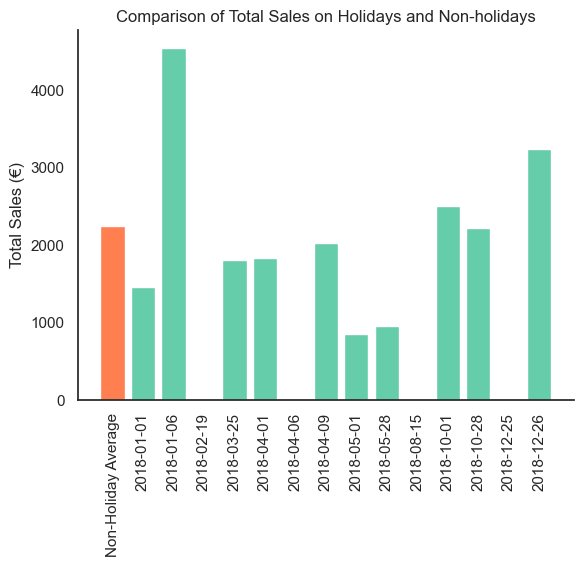

In [367]:
# Calculate average daily total sales for a day which is not a holiday
non_holiday_avg = ds_imp[ds_imp['IsHoliday']==0].groupby(ds_imp['InvoiceDateHour'].dt.date)['TotalAmount'].sum().mean()

# Create a bar chart with daily average total amount and holiday days
sns.set_theme(style='white')
fig, ax = plt.subplots()
ax.bar('Non-Holiday', non_holiday_avg, color='coral')
holiday_days = [
    "2018-01-01",  # New Year's Day
    "2018-01-06",  # Epiphany
    "2018-02-19",  # Green Monday
    "2018-03-25",  # Greek Independence Day
    "2018-04-01",  # Cyprus National Day
    "2018-04-06",  # Good Friday
    "2018-04-09",  # Easter Monday
    "2018-05-01",  # Labor Day
    "2018-05-28",  # Orthodox Pentecost Monday
    "2018-08-15",  # Assumption of the Virgin Mary
    "2018-10-01",  # Cyprus Independence Day
    "2018-10-28",  # Ochi Day
    "2018-12-25",  # Christmas Day
    "2018-12-26"   # Boxing Day
]
holiday_totals = []
for day in holiday_days:
    holiday_total = ds_imp.loc[ds_imp['InvoiceDateHour'].dt.date.astype(str) == day]['TotalAmount'].sum()
    holiday_totals.append(holiday_total)
ax.bar(range(1, len(holiday_days)+1), holiday_totals, color='mediumaquamarine')
plt.xticks(range(len(holiday_days)+1), ['Non-Holiday Average'] + list(holiday_days), rotation=90)
plt.ylabel('Total Sales (€)')
plt.title('Comparison of Total Sales on Holidays and Non-holidays')
sns.despine()
plt.show()

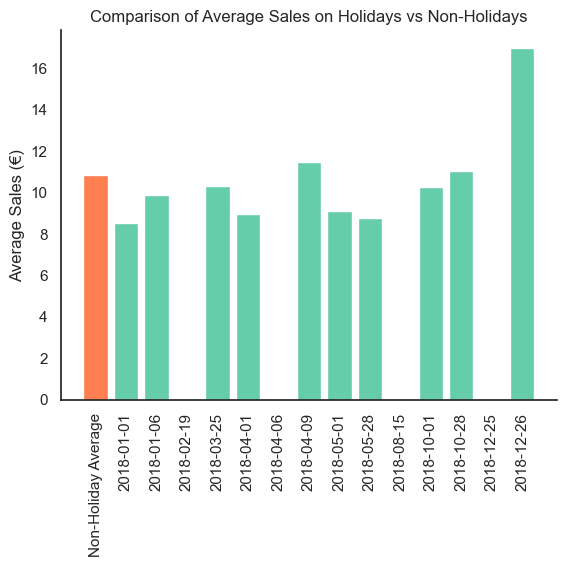

In [368]:
# Calculate average daily total sales for each order in a specific day which is not a holiday
non_holiday_avg = ds_imp[ds_imp['IsHoliday']==0].groupby(ds_imp['InvoiceDateHour'].dt.date)['TotalAmount'].mean().mean()

# Create a bar chart with daily average total amount and holiday days
sns.set_theme(style='white')
fig, ax = plt.subplots()
ax.bar('Non-Holiday', non_holiday_avg, color='coral')
holidays_days = [
    "2018-01-01",  # New Year's Day
    "2018-01-06",  # Epiphany
    "2018-02-19",  # Green Monday
    "2018-03-25",  # Greek Independence Day
    "2018-04-01",  # Cyprus National Day
    "2018-04-06",  # Good Friday
    "2018-04-09",  # Easter Monday
    "2018-05-01",  # Labor Day
    "2018-05-28",  # Orthodox Pentecost Monday
    "2018-08-15",  # Assumption of the Virgin Mary
    "2018-10-01",  # Cyprus Independence Day
    "2018-10-28",  # Ochi Day
    "2018-12-25",  # Christmas Day
    "2018-12-26"   # Boxing Day
]
holiday_totals = []
for day in holiday_days:
    holiday_total = ds_imp.loc[ds_imp['InvoiceDateHour'].dt.date.astype(str) == day]['TotalAmount'].mean()
    holiday_totals.append(holiday_total)
ax.bar(range(1, len(holiday_days)+1), holiday_totals, color='mediumaquamarine')
plt.xticks(range(len(holiday_days)+1), ['Non-Holiday Average'] + list(holiday_days), rotation=90)
plt.ylabel('Average Sales (€)')
plt.title('Comparison of Average Sales on Holidays vs Non-Holidays')
sns.despine()
plt.show()

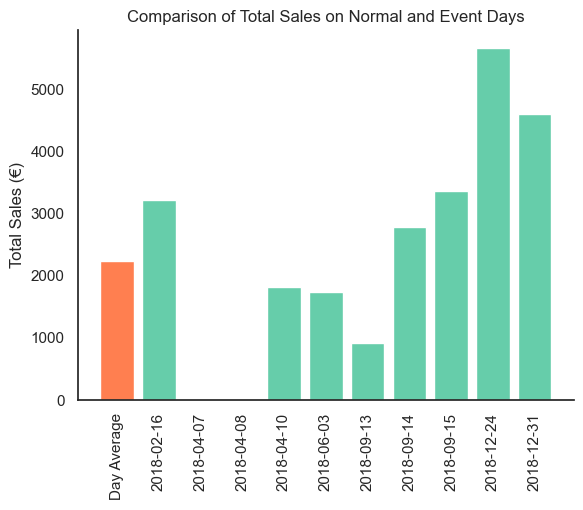

In [405]:
# Calculate average daily total sales for a day which is not a holiday
day_avg = ds_imp.groupby(ds_imp['InvoiceDateHour'].dt.date)['TotalAmount'].sum().mean()

# Create a bar chart with daily average total amount and holiday days
sns.set_theme(style='white')
fig, ax = plt.subplots()
ax.bar('Day Average', day_avg, color='coral')
event_days = [
    "2018-02-16",  # Chinese New Year
    "2018-04-07",  # Holy Saturday
    "2018-04-08",  # Easter Sunday
    "2018-04-10",  # Orthodox Easter Tuesday
    "2018-06-03",  # Nicosia Pride
    "2018-09-13",  # Nicosia Beer Fest
    "2018-09-14",
    "2018-09-15",
    "2018-12-24",  # Christmas Eve
    "2018-12-31"   # New Year's Eve
]
event_totals = []
for day in event_days:
    event_total = ds_imp.loc[ds_imp['InvoiceDateHour'].dt.date.astype(str) == day]['TotalAmount'].sum()
    event_totals.append(event_total)
ax.bar(range(1, len(event_days)+1), event_totals, color='mediumaquamarine')
plt.xticks(range(len(event_days)+1), ['Day Average'] + list(event_days), rotation=90)
plt.ylabel('Total Sales (€)')
plt.title('Comparison of Total Sales on Normal and Event Days')
sns.despine()
plt.show()

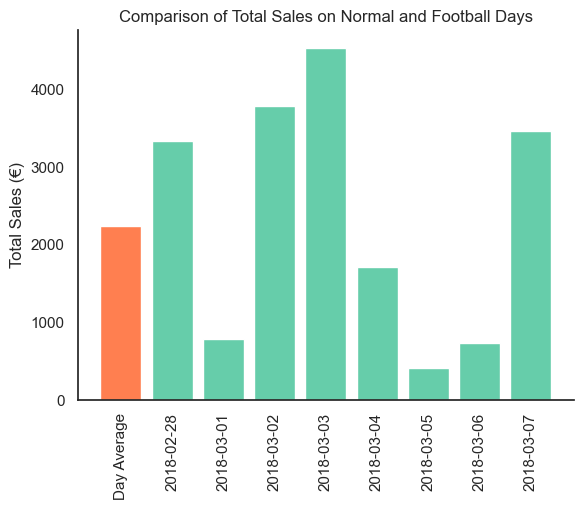

In [370]:
# Calculate average daily total sales for a day which is not a holiday
day_avg = ds_imp.groupby(ds_imp['InvoiceDateHour'].dt.date)['TotalAmount'].sum().mean()

# Create a bar chart with daily average total amount and holiday days
sns.set_theme(style='white')
fig, ax = plt.subplots()
ax.bar('Day Average', day_avg, color='coral')
football_days = [   # Cyprus Women's Cup International Football Tournament
    "2018-02-28",
    "2018-03-01",
    "2018-03-02",
    "2018-03-03",
    "2018-03-04",
    "2018-03-05",
    "2018-03-06",
    "2018-03-07"
]
football_totals = []
for day in football_days:
    football_total = ds_imp.loc[ds_imp['InvoiceDateHour'].dt.date.astype(str) == day]['TotalAmount'].sum()
    football_totals.append(football_total)
ax.bar(range(1, len(football_days)+1), football_totals, color='mediumaquamarine')
plt.xticks(range(len(football_days)+1), ['Day Average'] + list(football_days), rotation=90)
plt.ylabel('Total Sales (€)')
plt.title('Comparison of Total Sales on Normal and Football Days')
sns.despine()
plt.show()

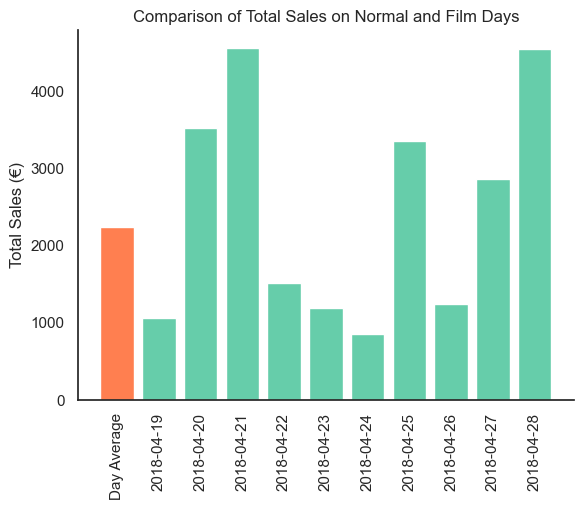

In [371]:
# Calculate average daily total sales for a day which is not a holiday
day_avg = ds_imp.groupby(ds_imp['InvoiceDateHour'].dt.date)['TotalAmount'].sum().mean()

# Create a bar chart with daily average total amount and holiday days
sns.set_theme(style='white')
fig, ax = plt.subplots()
ax.bar('Day Average', day_avg, color='coral')
film_days = [        # Cyprus Film Days International Festival
    "2018-04-19",
    "2018-04-20",
    "2018-04-21",
    "2018-04-22",
    "2018-04-23",
    "2018-04-24",
    "2018-04-25",
    "2018-04-26",
    "2018-04-27",
    "2018-04-28"
]
film_totals = []
for day in film_days:
    film_total = ds_imp.loc[ds_imp['InvoiceDateHour'].dt.date.astype(str) == day]['TotalAmount'].sum()
    film_totals.append(film_total)
ax.bar(range(1, len(film_days)+1), film_totals, color='mediumaquamarine')
plt.xticks(range(len(film_days)+1), ['Day Average'] + list(film_days), rotation=90)
plt.ylabel('Total Sales (€)')
plt.title('Comparison of Total Sales on Normal and Film Days')
sns.despine()
plt.show()

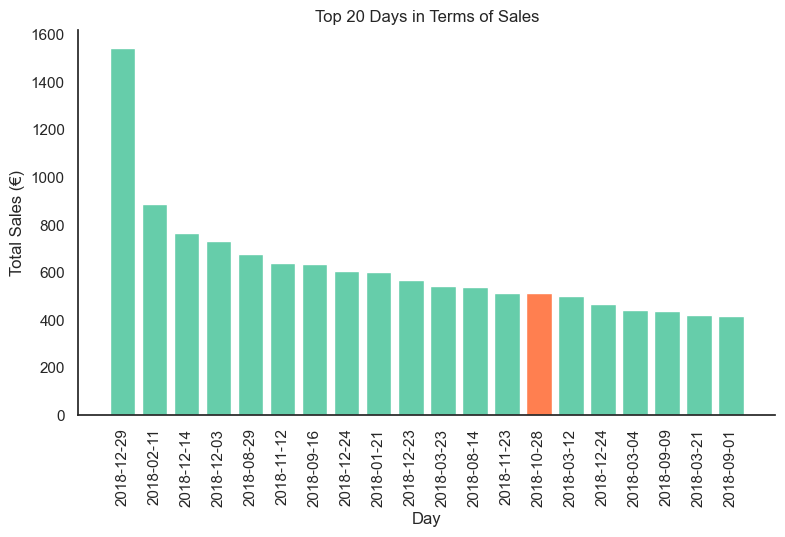

In [372]:
# Aggregate the TotalAmount by InvoiceDateHour
df_sales = ds_imp.groupby(['InvoiceDateHour']).agg({'TotalAmount': 'sum', 'IsHoliday': 'max'})

# Sort the values by TotalAmount and get the top 20
df_top20 = df_sales.nlargest(20, 'TotalAmount') 

# Create a bar plot
sns.set_theme(style='white')
fig, ax = plt.subplots(figsize=(9, 5))

# Create a list of colors based on IsHoliday column
colors = ['coral' if is_holiday else 'mediumaquamarine' for is_holiday in df_top20['IsHoliday']]

# Plot the bar chart
ax.bar(range(20), df_top20['TotalAmount'], color=colors)

# Set the title and labels
ax.set_title('Top 20 Days in Terms of Sales')
ax.set_xlabel('Day')
ax.set_ylabel('Total Sales (€)')

# Set the tick labels to the corresponding day
ax.set_xticks(range(20))
ax.set_xticklabels(df_top20.index.strftime('%Y-%m-%d'), rotation=90)

sns.despine()
plt.show()

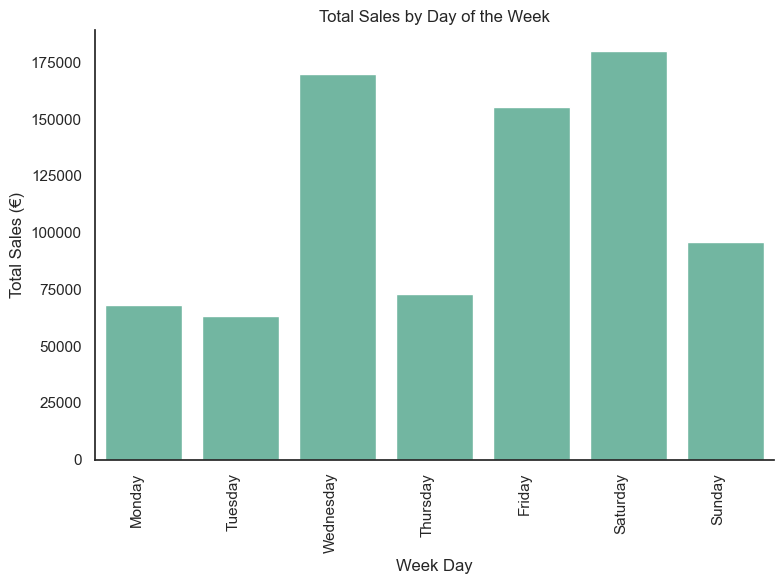

In [373]:
# Calculate total sales amount by day of the week
sales_by_day = ds_imp.groupby('DayWeek')['TotalAmount'].sum()

# Define the desired order of the days of the week
desired_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

# Reindex the sales_by_city variable with the desired order of the days of the week
sales_by_day = sales_by_day.reindex(desired_order)

# Create bar chart
plt.figure(figsize=(8,6))
colors = sns.color_palette('Set2', n_colors=1)
sns.barplot(x=sales_by_day.index, y=sales_by_day.values, palette=colors)
plt.xlabel('Week Day')
plt.ylabel('Total Sales (€)')
plt.title('Total Sales by Day of the Week')
plt.xticks(rotation=90, ha='right')
plt.tight_layout()

sns.despine()
plt.show()

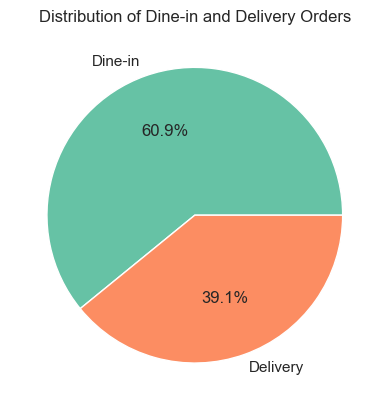

In [361]:
# Calculate number of delivery vs. non-delivery orders
delivery_counts = ds_imp['IsDelivery'].value_counts()

# Create dictionary for label replacement
label_dict = {0: 'Dine-in', 1: 'Delivery'}

# Create a new delivery_counts with the new index
delivery_counts.index = [label_dict[x] if x in label_dict else x for x in delivery_counts.index]

# Create pie chart
palette = sns.color_palette('Set2', n_colors=len(ds_imp['IsDelivery'].unique()))
plt.pie(delivery_counts.values, labels=delivery_counts.index, autopct='%1.1f%%', colors=palette)
plt.title('Distribution of Dine-in and Delivery Orders')
plt.show()

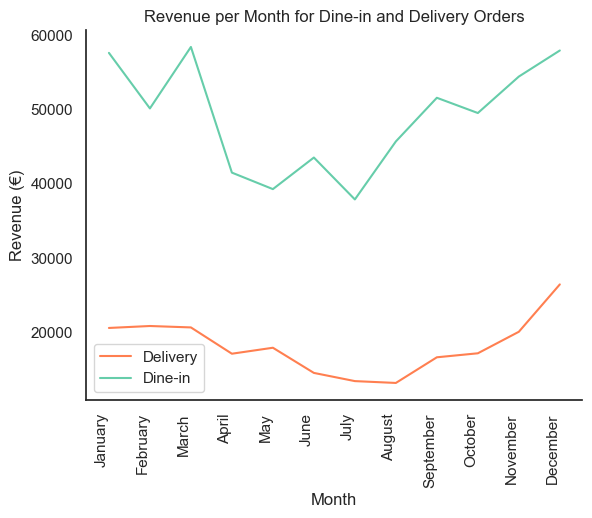

In [362]:
# Define the order of the months
Months = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 
          'December']

# Group the data by month and calculate the total revenue for each dataframe
monthly_revenue_isdelivery = ds_imp[ds_imp['IsDelivery']==1].groupby(
        ds_imp['InvoiceDateHour'].dt.strftime('%m'))['TotalAmount'].agg('sum')
monthly_revenue_isnotdelivery = ds_imp[ds_imp['IsDelivery']==0].groupby(
        ds_imp['InvoiceDateHour'].dt.strftime('%m'))['TotalAmount'].agg('sum')

# Create the line plot with two lines, one for each dataframe
plt.plot(Months, monthly_revenue_isdelivery.values, label='IsDelivery', color='coral')
plt.plot(Months, monthly_revenue_isnotdelivery.values, label='IsNotDelivery', 
         color='mediumaquamarine')

# Set the x-axis label
plt.xlabel('Month')

# Set the y-axis label
plt.ylabel('Revenue (€)')

# Rotate the labels
plt.xticks(rotation=90, ha='right')

# Add a legend to the plot
plt.legend(['Delivery','Dine-in'])

# Add a title to the plot
plt.title('Revenue per Month for Dine-in and Delivery Orders')

plt.grid(False) # to remove the grid

# Show the plot
sns.despine()
plt.show()

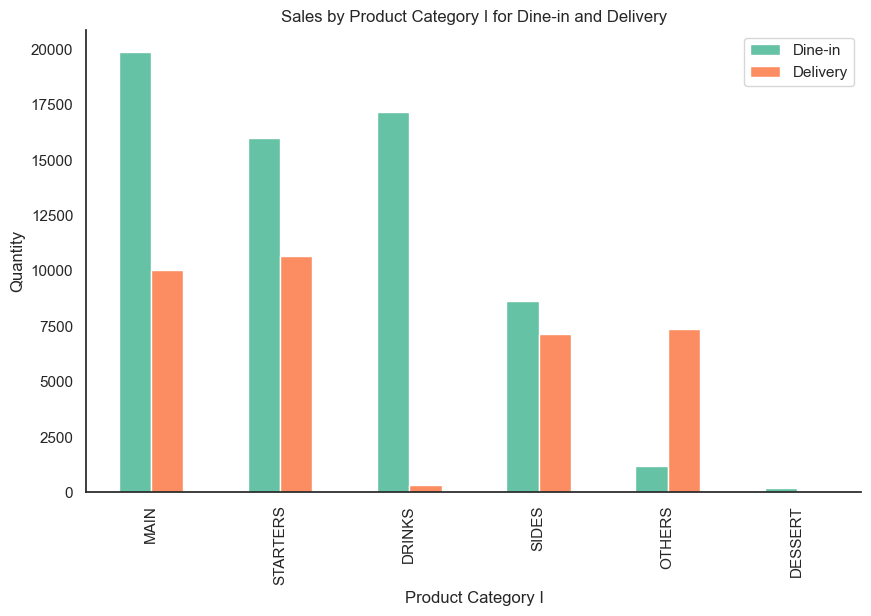

In [363]:
# Create pivot table of sales by product family and is_delivery
sales_by_categoryI_and_delivery = pd.pivot_table(ds_imp, values='Qty', index='ProductCategoryI', columns='IsDelivery', aggfunc='sum')

# Calculate total sales for each ProductCategoryI
sales_by_categoryI_and_delivery['Total'] = sales_by_categoryI_and_delivery.sum(axis=1)

# Sort by descending order of total sales
sales_by_categoryI_and_delivery = sales_by_categoryI_and_delivery.sort_values('Total', ascending=False)

# Remove the Total column
sales_by_categoryI_and_delivery = sales_by_categoryI_and_delivery.drop('Total', axis=1)

# Create stacked bar chart
colors = sns.color_palette('Set2')
ax = sales_by_categoryI_and_delivery.plot(kind='bar', stacked=False, figsize=(10,6), color=colors)
plt.title('Sales by Product Category I for Dine-in and Delivery')
plt.xlabel('Product Category I')
plt.ylabel('Quantity')
plt.legend(['Dine-in', 'Delivery'])

ax.grid(False) # to remove the grid

sns.despine()
plt.show()

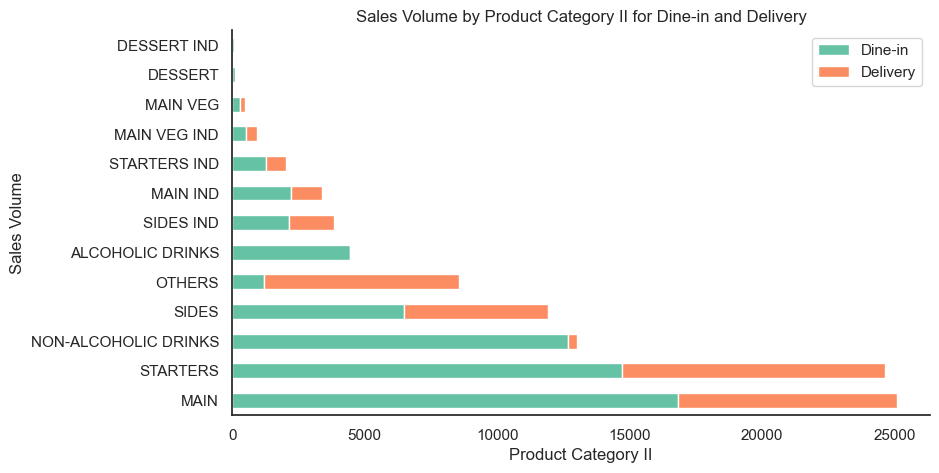

In [364]:
# Create pivot table of sales by product category and is_delivery
sales_by_product_and_delivery = pd.pivot_table(ds_imp, values='Qty', index='ProductCategoryII', columns='IsDelivery', 
                                               aggfunc='sum')

# Calculate total sales for each product category
sales_by_product_and_delivery['Total'] = sales_by_product_and_delivery.sum(axis=1)

# Sort by descending order of total sales
sales_by_product_and_delivery = sales_by_product_and_delivery.sort_values('Total', ascending=False)

# Remove the Total column
sales_by_product_and_delivery = sales_by_product_and_delivery.drop('Total', axis=1)

# Create stacked bar chart
sns.set_theme(style='white')
colors = sns.color_palette('Set2')
sales_by_product_and_delivery.plot(kind='barh', stacked=True, figsize=(9,5), color = colors)
plt.title('Sales Volume by Product Category II for Dine-in and Delivery')
plt.xlabel('Product Category II')
plt.ylabel('Sales Volume')
plt.legend(['Dine-in', 'Delivery'])

sns.despine()
plt.show()

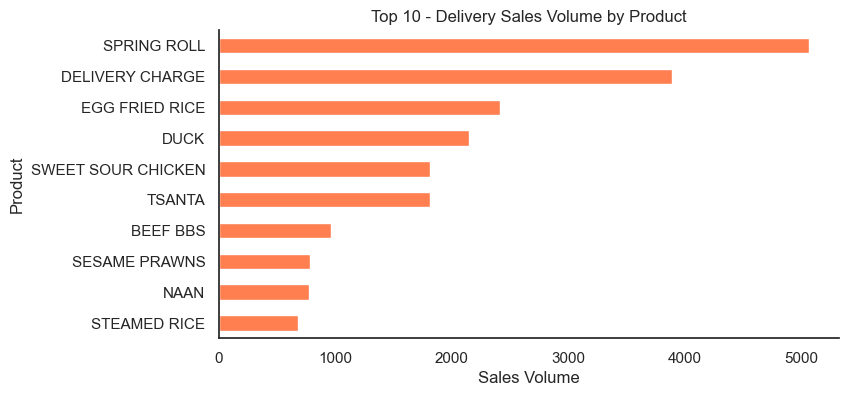

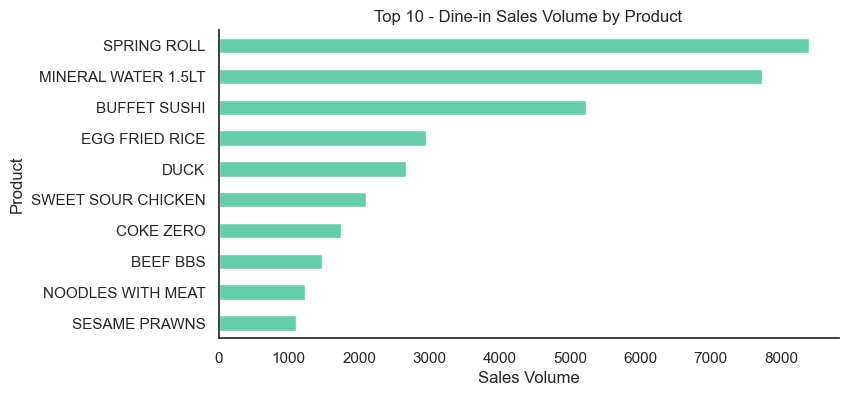

In [365]:
# Top 10 products
# Create pivot table of sales by product for delivery sales
sales_by_product_delivery = pd.pivot_table(ds_imp[ds_imp['IsDelivery']==1], values='Qty', index='Product', aggfunc='sum')

# Get the top 10 products based on delivery quantity
top_delivery_products = sales_by_product_delivery.nlargest(10, 'Qty').index

# Select only the top 10 products
sales_by_product_delivery = sales_by_product_delivery.loc[top_delivery_products]

# Sort
sales_by_product_delivery = sales_by_product_delivery.sort_values('Qty')


# Create bar chart for delivery sales
ax = sales_by_product_delivery.plot(kind='barh', stacked=False, figsize=(8,4), color='coral')
plt.title('Top 10 - Delivery Sales Volume by Product')
plt.xlabel('Sales Volume')
plt.ylabel('Product')

ax.legend().remove() # to remove the legend
ax.grid(False) # to remove the grid
sns.despine()
plt.show()

# Create pivot table of sales by product for non-delivery sales
sales_by_product_notdelivery = pd.pivot_table(ds_imp[ds_imp['IsDelivery']==0], values='Qty', index='Product', aggfunc='sum')

# Get the top 10 products based on non-delivery quantity
top_notdelivery_products = sales_by_product_notdelivery.nlargest(10, 'Qty').index

# Select only the top 10 products
sales_by_product_notdelivery = sales_by_product_notdelivery.loc[top_notdelivery_products]

# Sort
sales_by_product_notdelivery = sales_by_product_notdelivery.sort_values('Qty')

# Create bar chart for non-delivery sales
ax = sales_by_product_notdelivery.plot(kind='barh', stacked=False, figsize=(8,4), color='mediumaquamarine')
plt.title('Top 10 - Dine-in Sales Volume by Product')
plt.xlabel('Sales Volume')
plt.ylabel('Product')

ax.legend().remove() # to remove the legend
ax.grid(False) # to remove the grid

sns.despine()
plt.show()

In [366]:
# Subset the original dataframe to include only the relevant columns
df_subset = ds_imp[['IsDelivery', 'ProductCategoryI', 'ProductCategoryII', 'Product', 'Qty']]
#df_subset['IsDelivery'] = df_subset['IsDelivery'].replace({0: 'Dine-in', 1: 'IsDelivery'}) #.map({0: 'Dine-in', 1: 'IsDelivery'})

# Calculate the percentage of each product
products_percentages = df_subset['Product'].value_counts(normalize=True)

# Find the products that represent more than 50% of the total
prod = products_percentages.cumsum() > 0.5
products_others = products_percentages.index[np.where(prod)].tolist()

# Replace the products that represent less than 50% with 'other'
df_subset['Product'] = np.where(df_subset['Product'].isin(products_others), 'Others', df_subset['Product'])

# Group the data by the specified columns and calculate the sum of the total amount
df_grouped = df_subset.groupby(['IsDelivery', 'ProductCategoryI', 'ProductCategoryII', 'Product']).sum().reset_index()

# Create the sunburst plot using plotly.express
fig = px.sunburst(df_grouped, path=['IsDelivery', 'ProductCategoryI', 'ProductCategoryII', 'Product'], values='Qty', 
                  color='IsDelivery', 
                  color_continuous_scale=[[0, 'rgb(0.4, 0.7607843137254902, 0.6470588235294118)'], 
                                          [1, 'rgb(0.9882352941176471, 0.5529411764705883, 0.3843137254901961)']])

# Add a title
fig.update_layout(
    title={
        'text': "Percentage of Products Bought by Category for Delivery (1) and Dine-in (0)",
        'y':0.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'
    }
)

fig.update_traces(textinfo='label+percent entry')
fig.update_coloraxes(showscale=False)
# Show the plot
fig.show()

For an analysis of the CustomerCity and CustomerSince, we can interpret the results as indicative for delivery customers. This because none (or almost none) of the dine-in customers have a city and a year of registration associated to them.

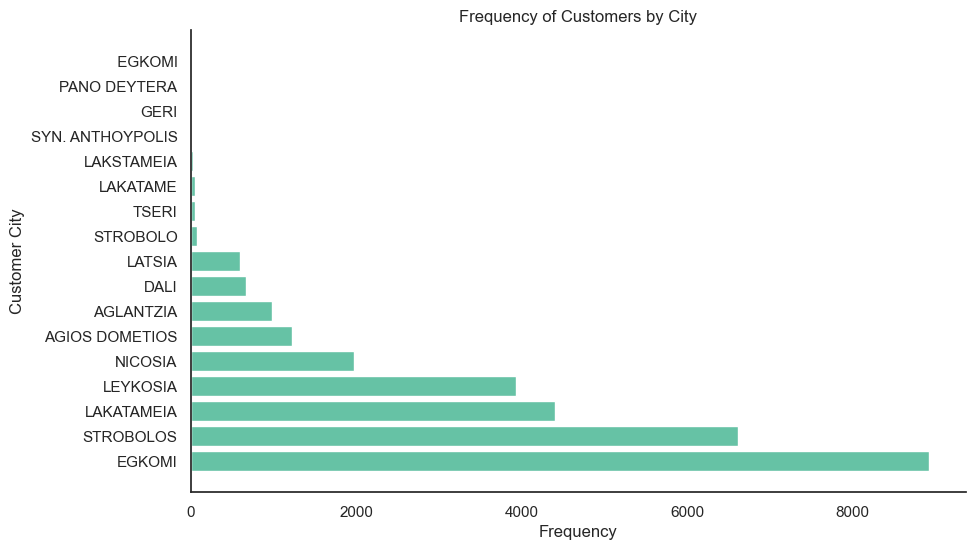

In [374]:
# create new dataframe with frequency counts of each city
df_city_freq = ds_imp['CustomerCity'].value_counts().reset_index()
df_city_freq.columns = ['CustomerCity', 'Frequency']

# sort the dataframe by frequency in descending order
df_city_freq = df_city_freq.sort_values('Frequency', ascending=False)

# create the horizontal bar chart
colors = sns.color_palette('Set2', n_colors=1)
fig, ax = plt.subplots(figsize=(10, 6))
ax.barh(df_city_freq['CustomerCity'], df_city_freq['Frequency'], color=colors)

# set x and y labels and title
ax.set_xlabel('Frequency')
ax.set_ylabel('Customer City')
ax.set_title('Frequency of Customers by City')

ax.grid(False) # to remove the grid
sns.despine()
plt.show()

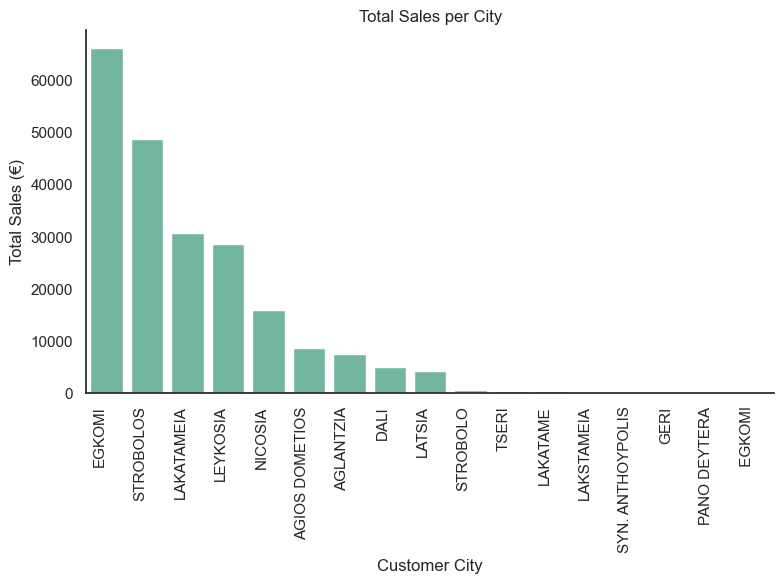

In [375]:
# Calculate total sales by city
sales_by_city = ds_imp.groupby('CustomerCity')['TotalAmount'].sum()

# Sort by descending sales volume
sales_by_city = sales_by_city.sort_values(ascending=False)

# Create bar chart
plt.figure(figsize=(8,6))
colors = sns.color_palette('Set2', n_colors=1)
sns.barplot(x=sales_by_city.index, y=sales_by_city.values, palette=colors)
plt.xlabel('Customer City')
plt.ylabel('Total Sales (€)')
plt.title('Total Sales per City')
plt.xticks(rotation=90, ha='right')
plt.tight_layout()

sns.despine()
plt.show()

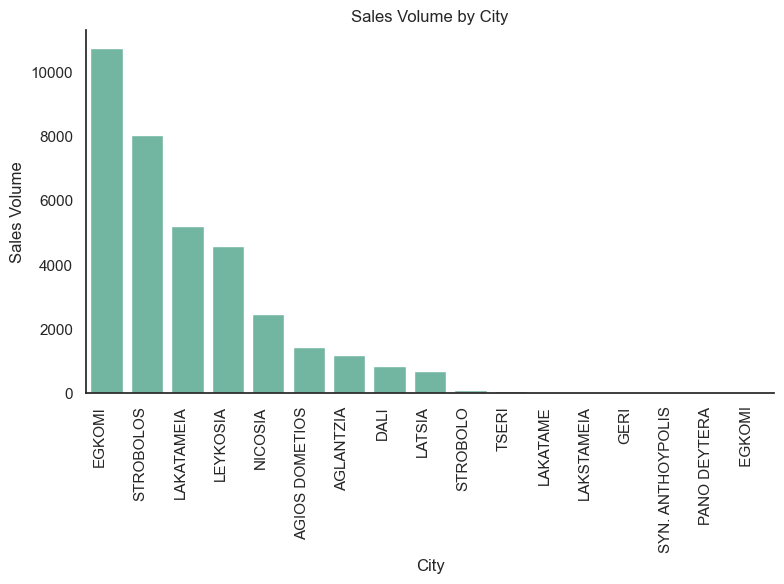

In [376]:
# Calculate total sales amount by city
sales_by_city = ds_imp.groupby('CustomerCity')['Qty'].sum()

# Sort by descending sales volume
sales_by_city = sales_by_city.sort_values(ascending=False)

# Create bar chart
plt.figure(figsize=(8,6))
colors = sns.color_palette('Set2', n_colors=1)
sns.barplot(x=sales_by_city.index, y=sales_by_city.values, palette=colors)
plt.xlabel('City')
plt.ylabel('Sales Volume')
plt.title('Sales Volume by City')
plt.xticks(rotation=90, ha='right')
plt.tight_layout()

sns.despine()
plt.show()

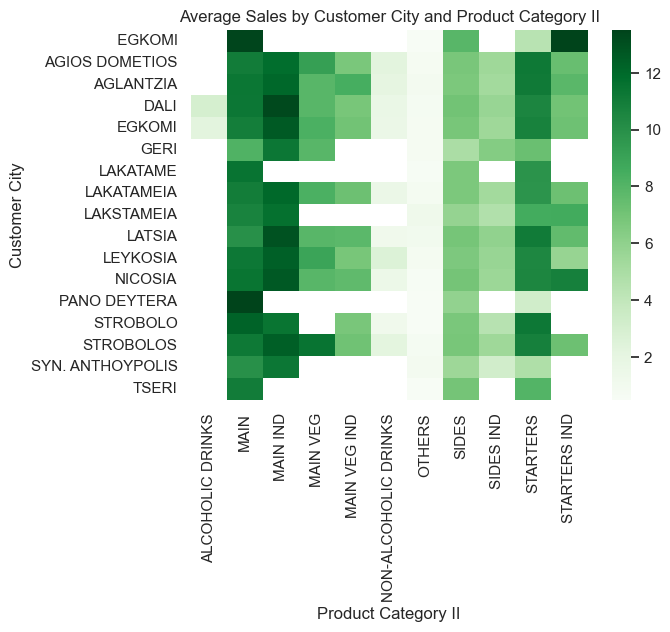

In [377]:
# Create pivot table to calculate mean sales by city and second product category
sales_by_city_family = ds_imp.pivot_table(index='CustomerCity', columns='ProductCategoryII', values='TotalAmount', 
                                          aggfunc='mean')

# Create heatmap
sns.heatmap(sales_by_city_family, cmap='Greens')
plt.xlabel('Product Category II')
plt.ylabel('Customer City')
plt.title('Average Sales by Customer City and Product Category II')
plt.show()

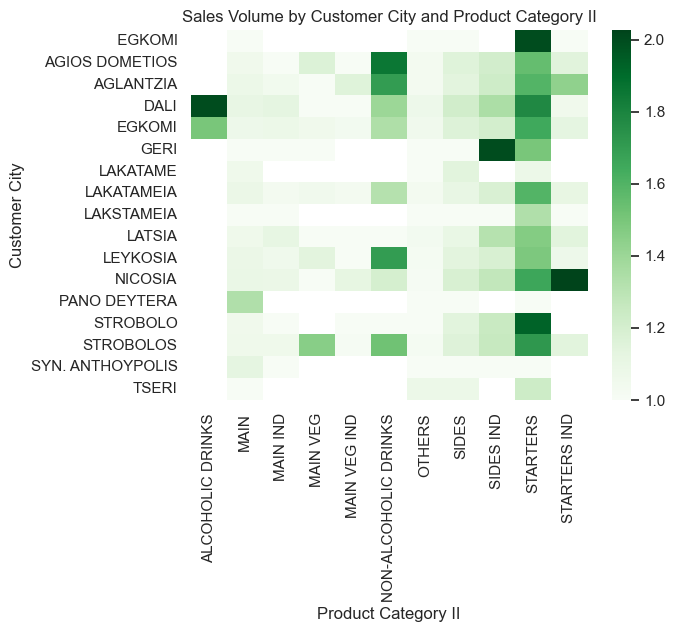

In [378]:
# Create pivot table to calculate mean sales volume by city and second product category
sales_by_city_family = ds_imp.pivot_table(index='CustomerCity', columns='ProductCategoryII', values='Qty', aggfunc='mean')

# Create heatmap
sns.heatmap(sales_by_city_family, cmap='Greens')
plt.xlabel('Product Category II')
plt.ylabel('Customer City')
plt.title('Sales Volume by Customer City and Product Category II')
plt.show()

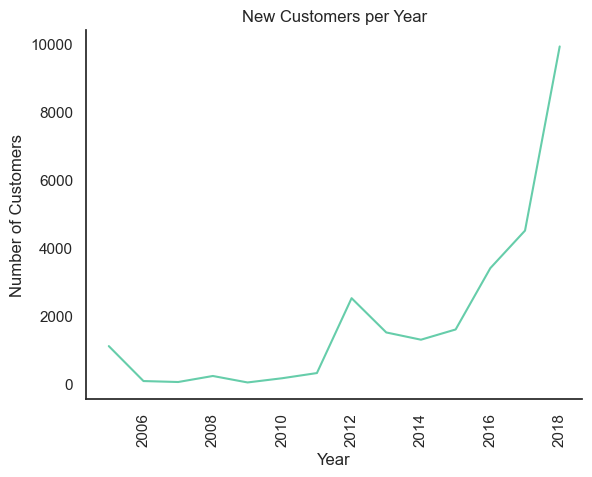

In [379]:
# Calculate new customers per year
new_customers_since_year = ds_imp.groupby('CustomerSinceYear').size()

# Create line chart

plt.plot(new_customers_since_year, color = 'mediumaquamarine')
plt.xticks(rotation=90)
plt.xlabel('Year')
plt.ylabel('Number of Customers')
plt.title('New Customers per Year')

sns.despine()
plt.show()

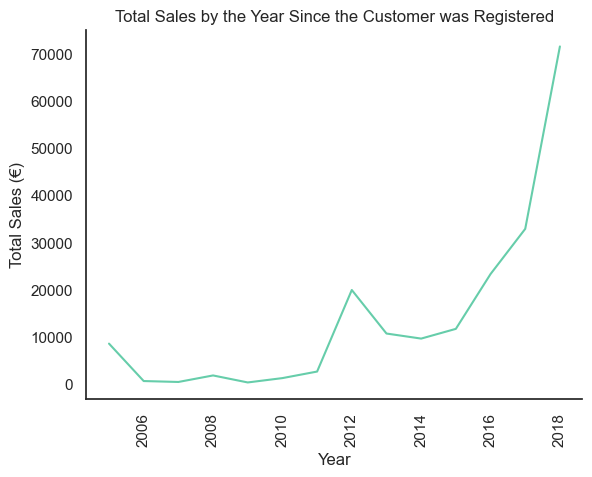

In [380]:
# Calculate total amount spent by new customers in each year
new_customers_amount_by_date = ds_imp.groupby('CustomerSinceYear')['TotalAmount'].sum()

# Create line chart

plt.plot(new_customers_amount_by_date, color = 'mediumaquamarine')
plt.xticks(rotation=90)
plt.xlabel('Year')
plt.ylabel('Total Sales (€)')
plt.title('Total Sales by the Year Since the Customer was Registered')

sns.despine()
plt.show()

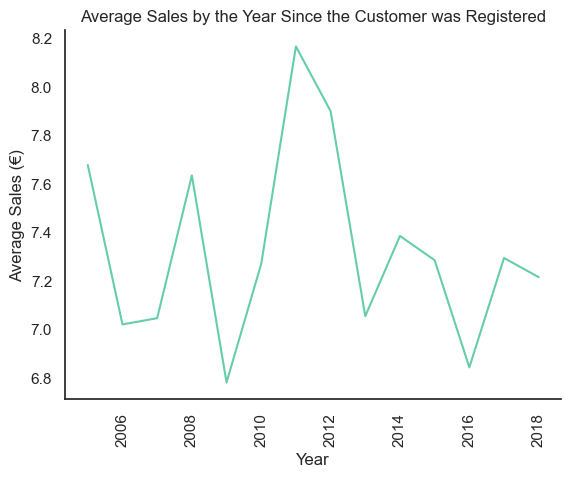

In [381]:
# Calculate mean total amount spent by new customers in each year
new_customers_mamount_by_date = ds_imp.groupby('CustomerSinceYear')['TotalAmount'].mean()

# Create line chart

plt.plot(new_customers_mamount_by_date, color = 'mediumaquamarine')
plt.xticks(rotation=90)
plt.xlabel('Year')
plt.ylabel('Average Sales (€)')
plt.title('Average Sales by the Year Since the Customer was Registered')

sns.despine()
plt.show()

In [382]:
# We have 233 products, which seems too large of a number
ds_imp['Product'].value_counts()

MINERAL WATER 1.5LT    5702
DUCK                   4775
EGG FRIED RICE         4462
SPRING ROLL            3968
DELIVERY CHARGE        3887
                       ... 
CLASSIC ROLLS VEG         1
HADJIMICHALI LEFKOS       1
 NO BABY CORN             1
SORBET IND                1
SELCTION FOR  TWO         1
Name: Product, Length: 233, dtype: int64

In [383]:
ds_imp['Product'].value_counts().sort_values(ascending=True).head(20)

SELCTION FOR  TWO         1
VEUVE CLICQUOT            1
BABATZIM ERODIOS ROSE     1
CLASSIC ROLLS CUCUMBER    1
DOUREIOS ERYTHROS         1
SORBET IND                1
 NO PORK                  1
CLASSIC ROLLS VEG         1
HADJIMICHALI LEFKOS       1
 NO BABY CORN             1
KTIMA MALLIA RED          1
PAPAGIANNAKOS RED         2
MAURO PROVATO ROSE        2
PAPAGIANNAKOS WHITE       3
FILTER COFFEE             3
BABATZIM KIOSK            3
CHOW MEIN BEEF            3
HENNESSY COGNAC           3
NESCAFE                   3
PRAWN CRACKERS            3
Name: Product, dtype: int64

In [384]:
np.array(ds_imp['Product'].value_counts().sort_values(ascending=True))

array([   1,    1,    1,    1,    1,    1,    1,    1,    1,    1,    1,
          2,    2,    3,    3,    3,    3,    3,    3,    3,    4,    4,
          4,    4,    4,    4,    5,    6,    6,    6,    6,    6,    7,
          7,    7,    7,    7,    8,    8,    9,    9,   10,   10,   11,
         11,   12,   12,   12,   12,   13,   14,   14,   14,   15,   16,
         17,   17,   17,   17,   18,   18,   19,   19,   20,   20,   21,
         22,   25,   25,   26,   26,   29,   32,   32,   34,   36,   36,
         36,   38,   42,   44,   47,   48,   48,   50,   51,   54,   56,
         58,   60,   61,   61,   62,   64,   64,   66,   66,   68,   68,
         69,   70,   72,   73,   74,   74,   75,   75,   76,   76,   76,
         77,   77,   79,   79,   80,   84,   85,   85,   93,   96,   97,
         99,  101,  102,  102,  104,  107,  108,  108,  110,  114,  117,
        118,  118,  121,  122,  124,  125,  130,  130,  144,  145,  149,
        152,  156,  157,  159,  163,  163,  166,  1

Some thought should be given to reducing the number of products available, for instance, by restricting those which are not present in more than 100 orders.

In [385]:
# People ask for a bag in 16% of the orders
pd.pivot_table(ds_imp[['DocNumber', 'Product']], index='DocNumber', columns='Product', 
                    aggfunc=lambda x: True if len(x)>0 else False).fillna(False)['TSANTA'].mean()

0.1578662334145681

In [386]:
# Considering only the delivery customers (for whom the bags were sold), bags were ordered 36% of the time
pd.pivot_table(ds_imp[ds_imp['IsDelivery']==1][['DocNumber', 'Product']], index='DocNumber', columns='Product', 
                    aggfunc=lambda x: True if len(x)>0 else False).fillna(False)['TSANTA'].mean()

0.3603956315681022

In [387]:
# People pay for a delivery charge in 35% of the orders
pd.pivot_table(ds_imp[['DocNumber', 'Product']], index='DocNumber', columns='Product', 
                    aggfunc=lambda x: True if len(x)>0 else False).fillna(False)['DELIVERY CHARGE'].mean()

0.3508439389836628

In [388]:
# Considering only the delivery customers (the only ones that might pay for delivery charge), delivery charge was paid 80% of 
#the time. This might be because of a promotion or if it is near enough that the restaurant does not charge
pd.pivot_table(ds_imp[ds_imp['IsDelivery']==1][['DocNumber', 'Product']], index='DocNumber', columns='Product', 
                    aggfunc=lambda x: True if len(x)>0 else False).fillna(False)['DELIVERY CHARGE'].mean()

0.8009478672985783

In [389]:
# We are going to remove the product TSANTA and DELIVERY CHARGE before association rules since it will only add noise to the
#modeling and we have analysed it above
ds_imp.drop(ds_imp[ds_imp['ProductDesignation']=='TSANTA'].index,inplace=True)
ds_imp.drop(ds_imp[ds_imp['ProductDesignation']=='DELIVERY CHARGE'].index,inplace=True)

In [390]:
# When it comes to offers, different products were offers, being drinks, starters or desserts
offers['ProductDesignation'].unique()

array(['TOFFEE BANANA COMPLEMENTARY', 'COFFEE COMPLIMENTARY',
       'PRAWN CRACKERS', 'TOFFEE APPLE COMPLEMENTARY', 'J&B',
       'LYCHEES COMPLIMENTARY', 'FAMOUS', 'J.WALKER RED', 'CHIVAS',
       'J.WALKER BLACK', 'CRISPY AROMATIC DUCK', 'MONTLY WINES'],
      dtype=object)

In [391]:
# The offers were both to dine-in and delivery customers (although most were to dine-in)
offers['IsDelivery'].value_counts()

0    2738
1     828
Name: IsDelivery, dtype: int64

In [392]:
# In total, we had 3566 offers
offers.shape[0]

3566

In [393]:
# As expected, group menus brought a lot of revenue to the restaurant
group_menus['TotalAmount'].sort_values(ascending=False).head(10)

60829    3000.0
37829    2160.0
29133    1196.0
10445    1064.0
1885      760.0
55151     750.0
38099     720.0
79598     713.0
72579     713.0
16476     650.0
Name: TotalAmount, dtype: float64

In [394]:
# Still, this only considers one of the items in an order
ds_imp['TotalAmount'].sort_values(ascending=False).head(10)

44595    500.0
69325    450.0
17608    420.0
6639     340.0
6685     280.0
14180    280.0
66433    280.0
68220    280.0
3732     280.0
70024    260.0
Name: TotalAmount, dtype: float64

In [395]:
# We also had free group menus that could be related to promotions or loyalty related orders
group_menus['TotalAmount'].sort_values().head(10)

67758    0.0
372      0.0
52695    0.0
53148    0.0
53507    0.0
41995    0.0
24380    0.0
5306     0.0
77505    0.0
3756     0.0
Name: TotalAmount, dtype: float64

In [396]:
# Most were registered as dine-in (the others could also be catering services for instance)
group_menus['IsDelivery'].value_counts()

0    340
1     53
Name: IsDelivery, dtype: int64

In [397]:
# We also had most under 1 or 2 in the variable Pax, which could indicate for instance that these were the people ordering, 
#errors or special menus 
group_menus['Pax'].value_counts().head()

2    84
1    64
3    56
4    53
6    47
Name: Pax, dtype: int64

In [398]:
# In total, we had 393 group menus
group_menus.shape[0]

393

<a class="anchor" id="selection">
    
## 3.5. Feature Selection
    
    
</a>

In [399]:
# These features would not affect the modeling, but to keep the dataset organized we have decided to still do feature selection

In [400]:
# The feature employeeid does not add value to the business objectives, therefore we will remove it
ds_imp.drop(columns='EmployeeID',inplace=True)

In [401]:
# As talked about above, the categories for ProductFamily are not well organized, therefore we will also remove it
ds_imp.drop(columns='ProductFamily',inplace=True)

In [402]:
# As talked about above, the categories for ProductDesignation are not well organized, therefore we will also remove it
ds_imp.drop(columns='ProductDesignation',inplace=True)

In [403]:
# These variables were created only for the purpose of generating insights
ds_imp.drop(columns=['CustomerSinceMonths','CustomerSinceYear','CustomerSinceMonth','CustomerSinceDay','InvoiceMonth',
                    'InvoiceDay','InvoiceHour','TempBin','PaxBin'],inplace=True)

<a class="anchor" id="export">
    
## 3.6. Export
    
    
</a>

In [404]:
ds_imp.to_csv("data_new.csv")